## <FONT COLOR = "BLUE">PROBLEM STATEMENT

In the recent past, the industry of wealth management has seen a lot of growth. Every individual or business actively searches for opportunities to get the maximum returns. However, in most of the cases, they either lack the skills to identify the right investment opportunity, or there is a shortage of time for finding these opportunities. Hence, this gave rise to the dedicated individuals who perform this task on behalf of the investors for a commission - **Portfolio managers.**

A portfolio manager makes investment decisions and carries out other related activities on behalf of vested investors. They work with a team of analysts and researchers, and their main objective is to realise the needs of the investor and suggest a suitable portfolio that meets all the expectations. They are responsible for establishing the best investment strategy, selecting appropriate investments along with the right allocation. However, in doing so, they face a lot of competition in the form of other portfolio managers and rival firms. Therefore, the portfolio manager has to use the available resources to provide the best solution to the investor.

Consider ourself working for an associate at an investment firm that manages accounts for private clients. Our role requires to analyse a portfolio of stocks to provide consultation on investment management based on client’s requirement.

## <FONT COLOR = "BLUE">BUSINESS OBJECTIVE

Being a portfolio manager, the task is to provide consultation to two different investors, Mr Patrick Jyenger and Mr Peter Jyenger based on their requirements and financial objectives

**Patrick Jyengar** - He is a conservative investor and he wants to invest 1 million dollars and expects double of his capital with less risk in the coming 5 years. He also wants to invest 500K dollars in a magazine(Naturo) and and remaining 500k Dollars in equities.

**Peter Jyengar** - He is an aggressive investor and he wants to invest 1 million dollars into most high margin stocks & expects retunes within 5 years for inorganic expansion of JWW.

### <FONT COLOR = "BLUE">Expected tasks in the assignment

1. We must use the elements of technical analysis to understand the trend of the underlying stocks. 

2. Using the metrics and the visualisations, compare the performance of the available securities against each other, and also against the market index, S&P500.

3. The findings should be aligned with the investor persona to select the appropriate stocks for the portfolio.

4. After the selection of stocks, the portfolio must be validated using the active investment strategy to estimate the prices in future. Check if the portfolio has the potential to fulfil the financial goals set by the investor.

## <FONT COLOR = "BLUE">DATA DESCRIPTION

- We are provided with the following information for 24 stocks of leading companies listed in New York Stock Exchange(NYSE):

  - Date
  - Open price: Price of stock at the start of the day
  - Close price: Price of stock at the end of the day
  - High price: Highest price reached by the stock on that day
  - Low price: Lowest price reached by the stock on that day
  - Adjusted close price: Stock price adjusted to include the annual returns (dividends) that the company offers to the shareholders
  - Volume traded: Number of stocks traded on the day
  
- The information for every stock ranges from 1st October 2010 to 30th September 2020.

- The stocks belong to different domains:
  - Technology/IT
  - Travel/Aviation/Hospitality
  - Banking/Financial Services and Insurance
  - Pharmaceuticals/Healthcare/Life Sciences
  
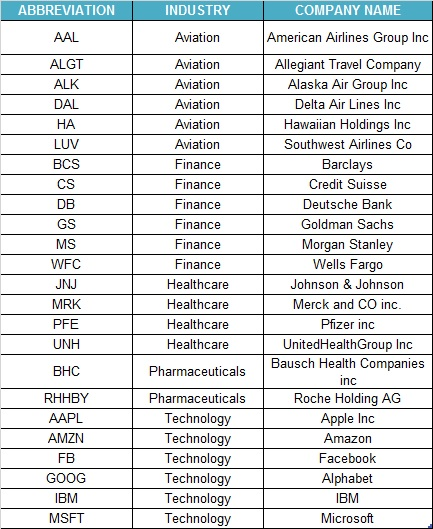
- To help us with the market benchmark, we are given the S&P 500 index prices for the same period.

## <FONT COLOR = "BLUE">IMPORTING LIBRARIES AND WARNINGS.

In [1]:
#import the warnings.
import warnings
warnings.filterwarnings("ignore")

In [2]:
import plotly.express as px
import plotly.graph_objects as go

In [3]:
#import the useful libraries.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import statsmodels
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
#sns.set_theme()
pd.set_option('display.max_columns', None)
#import math


## <FONT COLOR = "BLUE">IMPORTING DATASETS.

In [4]:
#For showing all outputs in one cell 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

Read the dataset and check the first five rows

### <FONT COLOR = "GREEN">AVIATION

In [5]:
#Importing Aviation Data - AAL
print('**************************************************AAL**************************************************************')
AAL_df = pd.read_csv("AAL.csv")
AAL_df.head()
print('')

print('*************************************************ALGT***************************************************************')
#Importing Aviation Data - ALGT
ALGT_df = pd.read_csv('ALGT.csv')
ALGT_df.head()
print('')

print('*************************************************ALK***************************************************************')
#Importing Aviation Data - ALK
ALK_df = pd.read_csv('ALK.csv')
ALK_df.head()
print('')

print('*************************************************DAL***************************************************************')
#Importing Aviation Data - DAL
DAL_df = pd.read_csv('DAL.csv')
DAL_df.head()
print('')

print('*************************************************HA***************************************************************')
#Importing Aviation Data - HA
HA_df = pd.read_csv('HA.csv')
HA_df.head()
print('')

print('*************************************************LUV***************************************************************')
#Importing Aviation Data - LUV
LUV_df = pd.read_csv('LUV.csv')
LUV_df.head()



**************************************************AAL**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,9.29,9.39,9.21,9.29,8.758067,3603800
1,04-10-2010,9.24,9.48,9.05,9.12,8.597802,3856800
2,05-10-2010,9.27,9.35,9.15,9.23,8.701504,3896600
3,06-10-2010,9.27,9.40,9.15,9.23,8.701504,3230200
4,07-10-2010,9.30,9.31,9.07,9.24,8.710930,3877700



*************************************************ALGT***************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,42.779999,43.259998,41.869999,43.230000,36.766212,159100.0
1,04-10-2010,43.250000,43.330002,41.310001,41.590000,35.371429,189700.0
2,05-10-2010,41.779999,42.130001,41.299999,42.099998,35.805168,175000.0
3,06-10-2010,42.080002,42.349998,41.349998,41.950001,35.677608,187200.0
4,07-10-2010,42.259998,42.270000,41.500000,41.700001,35.464993,162700.0



*************************************************ALK***************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,12.9325,12.9625,12.3675,12.4475,10.972344,1663600.0
1,04-10-2010,12.4300,12.5900,11.9975,12.1425,10.703489,1512400.0
2,05-10-2010,12.2600,12.2850,11.9450,12.2150,10.767396,2567200.0
3,06-10-2010,12.2200,12.3950,12.0875,12.1875,10.743157,1043600.0
4,07-10-2010,12.2775,12.3450,11.2150,11.6250,10.247319,7682400.0



*************************************************DAL***************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,11.75,12.01,11.71,12.01,10.668407,9094900.0
1,04-10-2010,11.70,12.01,11.45,11.51,10.224259,7916400.0
2,05-10-2010,11.57,11.87,11.45,11.83,10.508514,12624100.0
3,06-10-2010,11.87,12.05,11.56,11.78,10.464101,10124100.0
4,07-10-2010,11.80,11.82,11.61,11.77,10.455217,7162500.0



*************************************************HA***************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,6.02,6.05,5.88,5.96,5.742526,645400.0
1,04-10-2010,5.96,6.00,5.73,5.75,5.540189,618900.0
2,05-10-2010,5.82,5.93,5.77,5.85,5.636539,534800.0
3,06-10-2010,5.85,6.05,5.85,5.97,5.752162,2563900.0
4,07-10-2010,6.04,6.32,5.98,6.15,5.925593,1115200.0



*************************************************LUV***************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,13.23,13.24,12.92,12.94,12.018754,5722500.0
1,04-10-2010,12.92,13.09,12.62,12.82,11.907295,6537700.0
2,05-10-2010,12.97,13.16,12.94,13.02,12.093060,8060000.0
3,06-10-2010,12.96,13.10,12.72,12.94,12.018754,7457000.0
4,07-10-2010,12.98,13.03,12.85,12.88,11.963027,3413900.0


### <FONT COLOR = "GREEN">FINANCE

In [6]:
#Importing Finance Data - BCS
print('**************************************************BCS**************************************************************')
BCS_df = pd.read_csv('BCS.csv')
BCS_df.head()
print('')

#Importing Finance Data - CS
print('**************************************************CS**************************************************************')
CS_df = pd.read_csv('CS.csv')
CS_df.head()
print('')

#Importing Finance Data - DB
print('**************************************************DB**************************************************************')
DB_df = pd.read_csv('DB.csv')
DB_df.head()
print('')

#Importing Finance Data - GS
print('**************************************************GS**************************************************************')
GS_df = pd.read_csv('GS.csv')
GS_df.head()
print('')

#Importing Finance Data - MS
print('**************************************************MS**************************************************************')
MS_df = pd.read_csv('MS.csv')
MS_df.head()
print('')

#Importing Finance Data - WFC
print('**************************************************WFC**************************************************************')
WFC_df = pd.read_csv('WFC.csv')
WFC_df.head()

**************************************************BCS**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,16.709677,16.930876,16.663595,16.894009,12.665321,2144300.0
1,05-01-2010,17.631336,17.852535,17.520737,17.824884,13.363193,2710600.0
2,06-01-2010,17.797235,18.202765,17.695852,18.129032,13.591214,2124100.0
3,07-01-2010,18.617512,18.884792,18.506912,18.801844,14.095612,3932100.0
4,08-01-2010,18.986176,19.124424,18.755760,18.967741,14.219986,3055200.0



**************************************************CS**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,49.902344,51.035156,49.765625,50.771484,34.852165,734200.0
1,05-01-2010,51.250000,51.318359,50.644531,51.191406,35.140423,447700.0
2,06-01-2010,50.224609,50.917969,49.951172,50.478516,34.651054,751200.0
3,07-01-2010,51.250000,52.646484,51.201172,52.519531,36.052116,833700.0
4,08-01-2010,52.548828,53.339844,52.441406,53.291016,36.581703,706900.0



**************************************************DB**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,69.103050,70.162216,68.893127,69.875954,59.037861,469500.0
1,05-01-2010,71.412216,71.698471,70.610687,71.211830,60.166534,503300.0
2,06-01-2010,69.847328,70.543892,69.494278,69.980919,59.126545,495000.0
3,07-01-2010,70.133591,70.896950,69.809158,70.772903,59.795689,700100.0
4,08-01-2010,72.891220,73.416031,72.509544,73.330154,61.956295,763900.0



**************************************************GS**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,170.050003,174.250000,169.509995,173.080002,147.920776,9135000.0
1,05-01-2010,173.000000,176.259995,172.570007,176.139999,150.535919,11659400.0
2,06-01-2010,175.380005,175.380005,173.759995,174.259995,148.929138,7381100.0
3,07-01-2010,174.320007,178.750000,173.949997,177.669998,151.843475,8727400.0
4,08-01-2010,176.330002,177.429993,173.949997,174.309998,148.971909,7268100.0



**************************************************MS**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,30.700001,31.969999,30.629999,30.910000,25.759523,20371000.0
1,05-01-2010,31.010000,32.130001,30.930000,32.040001,26.701244,22523400.0
2,06-01-2010,31.969999,32.590000,31.790001,32.450001,27.042919,17028500.0
3,07-01-2010,32.459999,33.270000,32.270000,32.919998,27.434603,18693000.0
4,08-01-2010,32.599998,32.820000,31.980000,32.250000,26.876251,15993400.0



**************************************************WFC**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,04-01-2010,27.020000,27.48,26.820000,27.320000,20.318752,39335700.0
1,05-01-2010,27.270000,28.24,27.240000,28.070000,20.876556,55416000.0
2,06-01-2010,28.030001,28.33,27.790001,28.110001,20.906300,33237000.0
3,07-01-2010,28.120001,29.43,27.920000,29.129999,21.664902,61649000.0
4,08-01-2010,28.900000,29.35,28.600000,28.860001,21.464094,35508700.0


### <FONT COLOR = "GREEN">PHARMA_HEALTH CARE

In [7]:
#Importing Pharma_Healthcare Data - BHC
print('**************************************************BHC**************************************************************')
BHC_df = pd.read_csv('BHC.csv')
BHC_df.head()
print('')

#Importing Healthcare_Pharma Data - JNJ
print('**************************************************JNJ**************************************************************')
JNJ_df = pd.read_csv('JNJ.csv')
JNJ_df.head()
print('')

#Importing Healthcare_Pharma Data - MRK
print('**************************************************MRK**************************************************************')
MRK_df = pd.read_csv('MRK.csv')
MRK_df.head()
print('')

#Importing Healthcare_Pharma Data - PFE
print('**************************************************PFE**************************************************************')
PFE_df = pd.read_csv('PFE.csv')
PFE_df.head()
print('')

#Importing Healthcare_Pharma Data - RHHBY
print('**************************************************RHHBY**************************************************************')
RHHBY_df = pd.read_csv('RHHBY.csv')
RHHBY_df.head()
print('')

#Importing Healthcare_Pharma Data - UNH
print('**************************************************UNH**************************************************************')
UNH_df = pd.read_csv('UNH.csv')
UNH_df.head()

**************************************************BHC**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,25.120001,25.879999,25.100000,25.750000,24.757708,5778700.0
1,04-10-2010,25.750000,25.990000,25.590000,25.870001,24.873083,4187200.0
2,05-10-2010,26.040001,26.330000,25.830000,26.299999,25.286512,4610300.0
3,06-10-2010,26.150000,26.879999,26.049999,26.690001,25.661484,4448900.0
4,07-10-2010,26.700001,26.910000,26.440001,26.600000,25.574951,2453900.0



**************************************************JNJ**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,62.090000,62.250000,61.570000,61.750000,45.970119,9773200.0
1,04-10-2010,61.540001,61.980000,61.299999,61.669998,45.910553,8703600.0
2,05-10-2010,62.080002,62.939999,62.009998,62.799999,46.751797,12439400.0
3,06-10-2010,62.889999,63.259998,62.500000,63.209999,47.057022,11339800.0
4,07-10-2010,63.290001,63.500000,63.000000,63.220001,47.064480,9826600.0



**************************************************MRK**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,36.759998,36.840000,36.349998,36.599998,26.052284,11741900.0
1,04-10-2010,36.490002,36.750000,36.290001,36.520000,25.995331,9234900.0
2,05-10-2010,36.860001,37.150002,36.700001,37.020000,26.351234,10669200.0
3,06-10-2010,37.040001,37.220001,36.820000,37.009998,26.344130,7541300.0
4,07-10-2010,37.349998,37.389999,36.630001,36.709999,26.130579,13897800.0



**************************************************PFE**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,17.250000,17.290001,17.110001,17.180000,11.900640,35520800.0
1,04-10-2010,17.100000,17.200001,16.860001,16.900000,11.706684,40665800.0
2,05-10-2010,17.110001,17.250000,17.059999,17.230000,11.935278,44694000.0
3,06-10-2010,17.240000,17.379999,17.170000,17.260000,11.956057,35688300.0
4,07-10-2010,17.379999,17.510000,17.320000,17.379999,12.039181,38556300.0



**************************************************RHHBY**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,17.200001,17.450001,17.190001,17.389999,10.770474,1405600.0
1,04-10-2010,17.305000,17.344999,17.225000,17.275000,10.699248,453600.0
2,05-10-2010,17.575001,17.815001,17.549999,17.799999,11.024405,1406200.0
3,06-10-2010,17.959999,18.000000,17.875000,17.975000,11.132792,709800.0
4,07-10-2010,18.075001,18.100000,17.844999,17.930000,11.104921,709000.0



**************************************************UNH**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,35.070000,35.470001,34.759998,35.430000,30.229097,6503500.0
1,04-10-2010,35.299999,35.299999,34.349998,34.540001,29.469746,5883300.0
2,05-10-2010,34.770000,35.130001,34.549999,35.070000,29.921938,6887400.0
3,06-10-2010,35.040001,35.220001,33.939999,33.950001,28.966356,13815400.0
4,07-10-2010,34.389999,34.590000,34.110001,34.340000,29.299112,6878900.0


### <FONT COLOR = "GREEN">TECHNOLOGY

In [8]:
#Importing Technology Data - AAPL
print('**************************************************AAPL**************************************************************')
AAPL_df = pd.read_csv('AAPL.csv')
AAPL_df.head()
print('')

#Importing Technology Data - AMZN
print('**************************************************AMZN**************************************************************')
AMZN_df = pd.read_csv('AMZN.csv')
AMZN_df.head()
print('')

#Importing Technology Data - FB
print('**************************************************FB**************************************************************')
FB_df = pd.read_csv('FB.csv')
FB_df.head()
print('')

#Importing Technology Data - GOOG
print('**************************************************GOOG**************************************************************')
GOOG_df = pd.read_csv('GOOG.csv')
GOOG_df.head()
print('')

#Importing Technology Data - IBM
print('**************************************************IBM**************************************************************')
IBM_df = pd.read_csv('IBM.csv')
IBM_df.head()
print('')

#Importing Technology Data - MSFT
print('**************************************************MSFT**************************************************************')
MSFT_df = pd.read_csv('MSFT.csv')
MSFT_df.head()
print('')


**************************************************AAPL**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,10.219643,10.235000,10.048214,10.090000,8.719163,448142800
1,04-10-2010,10.057143,10.103572,9.920357,9.951428,8.599421,435302000
2,05-10-2010,10.071428,10.337500,10.065000,10.319285,8.917298,501967200
3,06-10-2010,10.342500,10.428214,10.187857,10.328215,8.925013,670868800
4,07-10-2010,10.369286,10.374286,10.246786,10.329286,8.925941,408399600



**************************************************AMZN**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,157.080002,157.440002,152.199997,153.710007,153.710007,8683400.0
1,04-10-2010,153.949997,155.960007,152.789993,155.389999,155.389999,5346500.0
2,05-10-2010,157.080002,161.210007,157.009995,160.869995,160.869995,5620000.0
3,06-10-2010,160.600006,160.679993,154.600006,155.399994,155.399994,6060800.0
4,07-10-2010,156.509995,157.399994,153.389999,156.270004,156.270004,4622000.0



**************************************************FB**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,18-05-2012,42.049999,45.000000,38.000000,38.230000,38.230000,573576400.0
1,21-05-2012,36.529999,36.660000,33.000000,34.029999,34.029999,168192700.0
2,22-05-2012,32.610001,33.590000,30.940001,31.000000,31.000000,101786600.0
3,23-05-2012,31.370001,32.500000,31.360001,32.000000,32.000000,73600000.0
4,24-05-2012,32.950001,33.209999,31.770000,33.029999,33.029999,50237200.0



**************************************************GOOG**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,264.010437,264.319275,260.523499,261.828613,261.828613,4466600.0
1,04-10-2010,261.494843,263.138702,258.456238,260.199707,260.199707,3895400.0
2,05-10-2010,263.203461,268.991760,262.291870,268.110046,268.110046,7040400.0
3,06-10-2010,268.623138,268.966858,263.980530,266.177307,266.177307,5545200.0
4,07-10-2010,267.103821,267.596985,263.582031,264.015411,264.015411,4809400.0



**************************************************IBM**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,135.509995,136.279999,135.089996,135.639999,97.152512,5621200.0
1,04-10-2010,135.229996,135.919998,134.389999,135.250000,96.873192,4059900.0
2,05-10-2010,136.179993,137.899994,136.119995,137.660004,98.599335,6202500.0
3,06-10-2010,136.880005,137.960007,136.830002,137.839996,98.728279,4783000.0
4,07-10-2010,137.919998,138.880005,137.520004,138.720001,99.358559,6440800.0



**************************************************MSFT**************************************************************


,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,24.770000,24.820000,24.299999,24.379999,19.315863,62672300.0
1,04-10-2010,23.959999,23.990000,23.780001,23.910000,18.943493,98143400.0
2,05-10-2010,24.059999,24.450001,23.910000,24.350000,19.292101,78152900.0
3,06-10-2010,24.320000,24.540001,24.129999,24.430000,19.355482,50489700.0
4,07-10-2010,24.620001,24.750000,24.280001,24.530001,19.434708,50096100.0


### <FONT COLOR = "GREEN">S&P500

In [9]:
# Importing the market reference (S&P500)
SP500_df = pd.read_csv('S&P500.csv')
SP500_df.head()



,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,04-10-2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,05-10-2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,06-10-2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,07-10-2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000


### <font color= 'BLUE'> RENAMING COLUMN NAMES

In [10]:
#Renaming the columns in the dataset for easy reference

AAL = AAL_df.rename(columns = {'Open': 'AAL_Open', 'High': 'AAL_High','Low': 'AAL_Low','Close': 'AAL_Close','Adj Close': 'AAL_Adj Close','Volume': 'AAL_Volume'}, inplace = False)
ALGT = ALGT_df.rename(columns = {'Open': 'ALGT_Open', 'High': 'ALGT_High','Low': 'ALGT_Low','Close': 'ALGT_Close','Adj Close': 'ALGT_Adj Close','Volume': 'ALGT_Volume'}, inplace = False)
ALK = ALK_df.rename(columns = {'Open': 'ALK_Open', 'High': 'ALK_High','Low': 'ALK_Low','Close': 'ALK_Close','Adj Close': 'ALK_Adj Close','Volume': 'ALK_Volume'}, inplace = False)
DAL = DAL_df.rename(columns = {'Open': 'DAL_Open', 'High': 'DAL_High','Low': 'DAL_Low','Close': 'DAL_Close','Adj Close': 'DAL_Adj Close','Volume': 'DAL_Volume'}, inplace = False)
HA = HA_df.rename(columns = {'Open': 'HA_Open', 'High': 'HA_High','Low': 'HA_Low','Close': 'HA_Close','Adj Close': 'HA_Adj Close','Volume': 'HA_Volume'}, inplace = False)
LUV = LUV_df.rename(columns = {'Open': 'LUV_Open', 'High': 'LUV_High','Low': 'LUV_Low','Close': 'LUV_Close','Adj Close': 'LUV_Adj Close','Volume': 'LUV_Volume'}, inplace = False)

BCS = BCS_df.rename(columns = {'Open': 'BCS_Open', 'High': 'BCS_High','Low': 'BCS_Low','Close': 'BCS_Close','Adj Close': 'BCS_Adj Close','Volume': 'BCS_Volume'}, inplace = False)
CS = CS_df.rename(columns = {'Open': 'CS_Open', 'High': 'CS_High','Low': 'CS_Low','Close': 'CS_Close','Adj Close': 'CS_Adj Close','Volume': 'CS_Volume'}, inplace = False)
DB= DB_df.rename(columns = {'Open': 'DB_Open', 'High': 'DB_High','Low': 'DB_Low','Close': 'DB_Close','Adj Close': 'DB_Adj Close','Volume': 'DB_Volume'}, inplace = False)
GS = GS_df.rename(columns = {'Open': 'GS_Open', 'High': 'GS_High','Low': 'GS_Low','Close': 'GS_Close','Adj Close': 'GS_Adj Close','Volume': 'GS_Volume'}, inplace = False)
MS = MS_df.rename(columns = {'Open': 'MS_Open', 'High': 'MS_High','Low': 'MS_Low','Close': 'MS_Close','Adj Close': 'MS_Adj Close','Volume': 'MS_Volume'}, inplace = False)
WFC = WFC_df.rename(columns = {'Open': 'WFC_Open', 'High': 'WFC_High','Low': 'WFC_Low','Close': 'WFC_Close','Adj Close': 'WFC_Adj Close','Volume': 'WFC_Volume'}, inplace = False)

BHC = BHC_df.rename(columns = {'Open': 'BHC_Open', 'High': 'BHC_High','Low': 'BHC_Low','Close': 'BHC_Close','Adj Close': 'BHC_Adj Close','Volume': 'BHC_Volume'}, inplace = False)
JNJ = JNJ_df.rename(columns = {'Open': 'JNJ_Open', 'High': 'JNJ_High','Low': 'JNJ_Low','Close': 'JNJ_Close','Adj Close': 'JNJ_Adj Close','Volume': 'JNJ_Volume'}, inplace = False)
MRK = MRK_df.rename(columns = {'Open': 'MRK_Open', 'High': 'MRK_High','Low': 'MRK_Low','Close': 'MRK_Close','Adj Close': 'MRK_Adj Close','Volume': 'MRK_Volume'}, inplace = False)
PFE = PFE_df.rename(columns = {'Open': 'PFE_Open', 'High': 'PFE_High','Low': 'PFE_Low','Close': 'PFE_Close','Adj Close': 'PFE_Adj Close','Volume': 'PFE_Volume'}, inplace = False)
RHHBY = RHHBY_df.rename(columns = {'Open': 'RHHBY_Open', 'High': 'RHHBY_High','Low': 'RHHBY_Low','Close': 'RHHBY_Close','Adj Close': 'RHHBY_Adj Close','Volume': 'RHHBY_Volume'}, inplace = False)
UNH = UNH_df.rename(columns = {'Open': 'UNH_Open', 'High': 'UNH_High','Low': 'UNH_Low','Close': 'UNH_Close','Adj Close': 'UNH_Adj Close','Volume': 'UNH_Volume'}, inplace = False)

AAPL = AAPL_df.rename(columns = {'Open': 'AAPL_Open', 'High': 'AAPL_High','Low': 'AAPL_Low','Close': 'AAPL_Close','Adj Close': 'AAPL_Adj Close','Volume': 'AAPL_Volume'}, inplace = False)
AMZN = AMZN_df.rename(columns = {'Open': 'AMZN_Open', 'High': 'AMZN_High','Low': 'AMZN_Low','Close': 'AMZN_Close','Adj Close': 'AMZN_Adj Close','Volume': 'AMZN_Volume'}, inplace = False)
FB = FB_df.rename(columns = {'Open': 'FB_Open', 'High': 'FB_High','Low': 'FB_Low','Close': 'FB_Close','Adj Close': 'FB_Adj Close','Volume': 'FB_Volume'}, inplace = False)
GOOG = GOOG_df.rename(columns = {'Open': 'GOOG_Open', 'High': 'GOOG_High','Low': 'GOOG_Low','Close': 'GOOG_Close','Adj Close': 'GOOG_Adj Close','Volume': 'GOOG_Volume'}, inplace = False)
IBM = IBM_df.rename(columns = {'Open': 'IBM_Open', 'High': 'IBM_High','Low': 'IBM_Low','Close': 'IBM_Close','Adj Close': 'IBM_Adj Close','Volume': 'IBM_Volume'}, inplace = False)
MSFT = MSFT_df.rename(columns = {'Open': 'MSFT_Open', 'High': 'MSFT_High','Low': 'MSFT_Low','Close': 'MSFT_Close','Adj Close': 'MSFT_Adj Close','Volume': 'MSFT_Volume'}, inplace = False)

SP500 = SP500_df.rename(columns = {'Open': 'S&P500_Open', 'High': 'S&P500_High','Low': 'S&P500_Low','Close': 'S&P500_Close','Adj Close': 'S&P500_Adj Close','Volume': 'S&P500_Volume'}, inplace = False)

**<font color= 'green'> For better readability we have added prefix to identify which coloumn belongs to which stock.**

In [11]:
#Now we will be taking necessary columns from the dataset


# S&P500 index
SP500 = SP500[['Date','S&P500_Close','S&P500_Volume']]

# Aviation stocks
AAL = AAL[['Date','AAL_Close','AAL_Volume']]
ALGT = ALGT[['Date','ALGT_Close','ALGT_Volume']]
ALK = ALK[['Date','ALK_Close','ALK_Volume']]
DAL = DAL[['Date','DAL_Close','DAL_Volume']]
HA = HA[['Date','HA_Close','HA_Volume']]
LUV = LUV[['Date','LUV_Close','LUV_Volume']]

# Finance stocks
BCS = BCS[['Date','BCS_Close','BCS_Volume']]
CS = CS[['Date','CS_Close','CS_Volume']]
DB = DB[['Date','DB_Close','DB_Volume']]
GS = GS[['Date','GS_Close','GS_Volume']]
MS = MS[['Date','MS_Close','MS_Volume']]
WFC = WFC[['Date','WFC_Close','WFC_Volume']]

# Pharma_healthcare stocks
BHC = BHC[['Date','BHC_Close','BHC_Volume']]
JNJ = JNJ[['Date','JNJ_Close','JNJ_Volume']]
MRK = MRK[['Date','MRK_Close','MRK_Volume']]
PFE = PFE[['Date','PFE_Close','PFE_Volume']]
RHHBY = RHHBY[['Date','RHHBY_Close','RHHBY_Volume']]
UNH = UNH[['Date','UNH_Close','UNH_Volume']]

# Technology stocks
AAPL = AAPL[['Date','AAPL_Close','AAPL_Volume']]
AMZN = AMZN[['Date','AMZN_Close','AMZN_Volume']]
FB = FB[['Date','FB_Close','FB_Volume']]
GOOG = GOOG[['Date','GOOG_Close','GOOG_Volume']]
IBM = IBM[['Date','IBM_Close','IBM_Volume']]
MSFT = MSFT[['Date','MSFT_Close','MSFT_Volume']]

### <font color= 'BLUE'> DATASET MERGING 

In [12]:
# mergING the selected columns of the data into a common dataset

stocks_df = pd.merge(SP500,  AAL,      how='inner', on='Date')
stocks_df = pd.merge(stocks_df, ALGT,  how='inner', on='Date')
stocks_df = pd.merge(stocks_df, ALK,   how='inner', on='Date')
stocks_df = pd.merge(stocks_df, DAL,   how='inner', on='Date')
stocks_df = pd.merge(stocks_df, HA,    how='inner', on='Date')
stocks_df = pd.merge(stocks_df, LUV,   how='inner', on='Date')
stocks_df = pd.merge(stocks_df, BCS,   how='inner', on='Date')

stocks_df = pd.merge(stocks_df, CS,    how='inner', on='Date')
stocks_df = pd.merge(stocks_df, DB,    how='inner', on='Date')
stocks_df = pd.merge(stocks_df, GS,    how='inner', on='Date')
stocks_df = pd.merge(stocks_df, MS,    how='inner', on='Date')
stocks_df = pd.merge(stocks_df, WFC,   how='inner', on='Date')

stocks_df = pd.merge(stocks_df, BHC,   how='inner', on='Date')
stocks_df = pd.merge(stocks_df, JNJ,   how='inner', on='Date')
stocks_df = pd.merge(stocks_df, MRK,   how='inner', on='Date')
stocks_df = pd.merge(stocks_df, PFE,   how='inner', on='Date')
stocks_df = pd.merge(stocks_df, RHHBY, how='inner', on='Date')
stocks_df = pd.merge(stocks_df, UNH,   how='inner', on='Date')

stocks_df = pd.merge(stocks_df, AAPL,  how='inner', on='Date')
stocks_df = pd.merge(stocks_df, AMZN,  how='inner', on='Date')
stocks_df = pd.merge(stocks_df, GOOG,  how='inner', on='Date')
stocks_df = pd.merge(stocks_df, IBM,   how='inner', on='Date')
stocks_df = pd.merge(stocks_df, MSFT,  how='inner', on='Date')
stocks_df = pd.merge(stocks_df, FB,    how='left', on='Date')

In [13]:
stocks_df.head()

,Date,S&P500_Close,S&P500_Volume,AAL_Close,AAL_Volume,ALGT_Close,ALGT_Volume,ALK_Close,ALK_Volume,DAL_Close,DAL_Volume,HA_Close,HA_Volume,LUV_Close,LUV_Volume,BCS_Close,BCS_Volume,CS_Close,CS_Volume,DB_Close,DB_Volume,GS_Close,GS_Volume,MS_Close,MS_Volume,WFC_Close,WFC_Volume,BHC_Close,BHC_Volume,JNJ_Close,JNJ_Volume,MRK_Close,MRK_Volume,PFE_Close,PFE_Volume,RHHBY_Close,RHHBY_Volume,UNH_Close,UNH_Volume,AAPL_Close,AAPL_Volume,AMZN_Close,AMZN_Volume,GOOG_Close,GOOG_Volume,IBM_Close,IBM_Volume,MSFT_Close,MSFT_Volume,FB_Close,FB_Volume
0,01-10-2010,1146.239990,4298910000,9.29,3603800,43.230000,159100.0,12.4475,1663600.0,12.01,9094900.0,5.96,645400.0,12.94,5722500.0,17.603687,3083200.0,42.226563,1814900.0,52.595421,2010600.0,147.699997,7439800.0,25.020000,16292200.0,25.559999,32117900.0,25.750000,5778700.0,61.750000,9773200.0,36.599998,11741900.0,17.180000,35520800.0,17.389999,1405600.0,35.430000,6503500.0,10.090000,448142800,153.710007,8683400.0,261.828613,4466600.0,135.639999,5621200.0,24.379999,62672300.0,NaN,NaN
1,04-10-2010,1137.030029,3604110000,9.12,3856800,41.590000,189700.0,12.1425,1512400.0,11.51,7916400.0,5.75,618900.0,12.82,6537700.0,17.502304,1362300.0,41.914063,1085600.0,51.755726,1245600.0,146.570007,5866700.0,24.709999,11955800.0,25.379999,25645400.0,25.870001,4187200.0,61.669998,8703600.0,36.520000,9234900.0,16.900000,40665800.0,17.275000,453600.0,34.540001,5883300.0,9.951428,435302000,155.389999,5346500.0,260.199707,3895400.0,135.250000,4059900.0,23.910000,98143400.0,NaN,NaN
2,05-10-2010,1160.750000,4068840000,9.23,3896600,42.099998,175000.0,12.2150,2567200.0,11.83,12624100.0,5.85,534800.0,13.02,8060000.0,18.156683,3028000.0,43.154297,1025300.0,53.950382,2270900.0,149.570007,8724700.0,25.469999,19234700.0,26.250000,42788700.0,26.299999,4610300.0,62.799999,12439400.0,37.020000,10669200.0,17.230000,44694000.0,17.799999,1406200.0,35.070000,6887400.0,10.319285,501967200,160.869995,5620000.0,268.110046,7040400.0,137.660004,6202500.0,24.350000,78152900.0,NaN,NaN
3,06-10-2010,1159.969971,4073160000,9.23,3230200,41.950001,187200.0,12.1875,1043600.0,11.78,10124100.0,5.97,2563900.0,12.94,7457000.0,17.944700,1934500.0,43.437500,871300.0,54.608780,1887400.0,150.839996,6330600.0,25.379999,15158700.0,26.299999,31852900.0,26.690001,4448900.0,63.209999,11339800.0,37.009998,7541300.0,17.260000,35688300.0,17.975000,709800.0,33.950001,13815400.0,10.328215,670868800,155.399994,6060800.0,266.177307,5545200.0,137.839996,4783000.0,24.430000,50489700.0,NaN,NaN
4,07-10-2010,1158.060059,3910550000,9.24,3877700,41.700001,162700.0,11.6250,7682400.0,11.77,7162500.0,6.15,1115200.0,12.88,3413900.0,17.253456,8002200.0,43.671875,1377000.0,54.036259,1191000.0,151.110001,4471500.0,25.070000,11649500.0,26.000000,27293900.0,26.600000,2453900.0,63.220001,9826600.0,36.709999,13897800.0,17.379999,38556300.0,17.930000,709000.0,34.340000,6878900.0,10.329286,408399600,156.270004,4622000.0,264.015411,4809400.0,138.720001,6440800.0,24.530001,50096100.0,NaN,NaN


## <font color= 'BLUE'> DATA UNDERSTANDING

In [14]:
# Check the shape of the dataframe

stocks_df.shape

(2517, 51)

In [15]:
# Check the datatypes and non-null value count of all the columns of the dataframe

stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2517 entries, 0 to 2516
Data columns (total 51 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           2517 non-null   object 
 1   S&P500_Close   2517 non-null   float64
 2   S&P500_Volume  2517 non-null   int64  
 3   AAL_Close      2517 non-null   float64
 4   AAL_Volume     2517 non-null   int64  
 5   ALGT_Close     2517 non-null   float64
 6   ALGT_Volume    2517 non-null   float64
 7   ALK_Close      2517 non-null   float64
 8   ALK_Volume     2517 non-null   float64
 9   DAL_Close      2517 non-null   float64
 10  DAL_Volume     2517 non-null   float64
 11  HA_Close       2517 non-null   float64
 12  HA_Volume      2517 non-null   float64
 13  LUV_Close      2517 non-null   float64
 14  LUV_Volume     2517 non-null   float64
 15  BCS_Close      2517 non-null   float64
 16  BCS_Volume     2517 non-null   float64
 17  CS_Close       2517 non-null   float64
 18  CS_Volum

In [16]:
#Checking the null values:

stocks_df.isnull().sum()

Date               0
S&P500_Close       0
S&P500_Volume      0
AAL_Close          0
AAL_Volume         0
ALGT_Close         0
ALGT_Volume        0
ALK_Close          0
ALK_Volume         0
DAL_Close          0
DAL_Volume         0
HA_Close           0
HA_Volume          0
LUV_Close          0
LUV_Volume         0
BCS_Close          0
BCS_Volume         0
CS_Close           0
CS_Volume          0
DB_Close           0
DB_Volume          0
GS_Close           0
GS_Volume          0
MS_Close           0
MS_Volume          0
WFC_Close          0
WFC_Volume         0
BHC_Close          0
BHC_Volume         0
JNJ_Close          0
JNJ_Volume         0
MRK_Close          0
MRK_Volume         0
PFE_Close          0
PFE_Volume         0
RHHBY_Close        0
RHHBY_Volume       0
UNH_Close          0
UNH_Volume         0
AAPL_Close         0
AAPL_Volume        0
AMZN_Close         0
AMZN_Volume        0
GOOG_Close         0
GOOG_Volume        0
IBM_Close          0
IBM_Volume         0
MSFT_Close   

**<font color= 'green'> There are some missing values in FB_Close & FB_Volume columns because the FB stock was listed in stock exchange on 18-05-2012.**

In [17]:
#Imputing the missing values of FB_Close & FB_Volume with zeroes:

stocks_df['FB_Close'] = stocks_df['FB_Close'].fillna(0)
stocks_df['FB_Volume'] = stocks_df['FB_Volume'].fillna(0)

In [18]:
#Checking the null values:

stocks_df.isnull().sum()

Date             0
S&P500_Close     0
S&P500_Volume    0
AAL_Close        0
AAL_Volume       0
ALGT_Close       0
ALGT_Volume      0
ALK_Close        0
ALK_Volume       0
DAL_Close        0
DAL_Volume       0
HA_Close         0
HA_Volume        0
LUV_Close        0
LUV_Volume       0
BCS_Close        0
BCS_Volume       0
CS_Close         0
CS_Volume        0
DB_Close         0
DB_Volume        0
GS_Close         0
GS_Volume        0
MS_Close         0
MS_Volume        0
WFC_Close        0
WFC_Volume       0
BHC_Close        0
BHC_Volume       0
JNJ_Close        0
JNJ_Volume       0
MRK_Close        0
MRK_Volume       0
PFE_Close        0
PFE_Volume       0
RHHBY_Close      0
RHHBY_Volume     0
UNH_Close        0
UNH_Volume       0
AAPL_Close       0
AAPL_Volume      0
AMZN_Close       0
AMZN_Volume      0
GOOG_Close       0
GOOG_Volume      0
IBM_Close        0
IBM_Volume       0
MSFT_Close       0
MSFT_Volume      0
FB_Close         0
FB_Volume        0
dtype: int64

In [19]:
# Dropping duplicate rows

stocks_df.drop_duplicates()

,Date,S&P500_Close,S&P500_Volume,AAL_Close,AAL_Volume,ALGT_Close,ALGT_Volume,ALK_Close,ALK_Volume,DAL_Close,DAL_Volume,HA_Close,HA_Volume,LUV_Close,LUV_Volume,BCS_Close,BCS_Volume,CS_Close,CS_Volume,DB_Close,DB_Volume,GS_Close,GS_Volume,MS_Close,MS_Volume,WFC_Close,WFC_Volume,BHC_Close,BHC_Volume,JNJ_Close,JNJ_Volume,MRK_Close,MRK_Volume,PFE_Close,PFE_Volume,RHHBY_Close,RHHBY_Volume,UNH_Close,UNH_Volume,AAPL_Close,AAPL_Volume,AMZN_Close,AMZN_Volume,GOOG_Close,GOOG_Volume,IBM_Close,IBM_Volume,MSFT_Close,MSFT_Volume,FB_Close,FB_Volume
0,01-10-2010,1146.239990,4298910000,9.29,3603800,43.230000,159100.0,12.447500,1663600.0,12.010000,9094900.0,5.96,645400.0,12.940000,5722500.0,17.603687,3083200.0,42.226563,1814900.0,52.595421,2010600.0,147.699997,7439800.0,25.020000,16292200.0,25.559999,32117900.0,25.750000,5778700.0,61.750000,9773200.0,36.599998,11741900.0,17.180000,35520800.0,17.389999,1405600.0,35.430000,6503500.0,10.090000,448142800,153.710007,8683400.0,261.828613,4466600.0,135.639999,5621200.0,24.379999,62672300.0,0.000000,0.0
1,04-10-2010,1137.030029,3604110000,9.12,3856800,41.590000,189700.0,12.142500,1512400.0,11.510000,7916400.0,5.75,618900.0,12.820000,6537700.0,17.502304,1362300.0,41.914063,1085600.0,51.755726,1245600.0,146.570007,5866700.0,24.709999,11955800.0,25.379999,25645400.0,25.870001,4187200.0,61.669998,8703600.0,36.520000,9234900.0,16.900000,40665800.0,17.275000,453600.0,34.540001,5883300.0,9.951428,435302000,155.389999,5346500.0,260.199707,3895400.0,135.250000,4059900.0,23.910000,98143400.0,0.000000,0.0
2,05-10-2010,1160.750000,4068840000,9.23,3896600,42.099998,175000.0,12.215000,2567200.0,11.830000,12624100.0,5.85,534800.0,13.020000,8060000.0,18.156683,3028000.0,43.154297,1025300.0,53.950382,2270900.0,149.570007,8724700.0,25.469999,19234700.0,26.250000,42788700.0,26.299999,4610300.0,62.799999,12439400.0,37.020000,10669200.0,17.230000,44694000.0,17.799999,1406200.0,35.070000,6887400.0,10.319285,501967200,160.869995,5620000.0,268.110046,7040400.0,137.660004,6202500.0,24.350000,78152900.0,0.000000,0.0
3,06-10-2010,1159.969971,4073160000,9.23,3230200,41.950001,187200.0,12.187500,1043600.0,11.780000,10124100.0,5.97,2563900.0,12.940000,7457000.0,17.944700,1934500.0,43.437500,871300.0,54.608780,1887400.0,150.839996,6330600.0,25.379999,15158700.0,26.299999,31852900.0,26.690001,4448900.0,63.209999,11339800.0,37.009998,7541300.0,17.260000,35688300.0,17.975000,709800.0,33.950001,13815400.0,10.328215,670868800,155.399994,6060800.0,266.177307,5545200.0,137.839996,4783000.0,24.430000,50489700.0,0.000000,0.0
4,07-10-2010,1158.060059,3910550000,9.24,3877700,41.700001,162700.0,11.625000,7682400.0,11.770000,7162500.0,6.15,1115200.0,12.880000,3413900.0,17.253456,8002200.0,43.671875,1377000.0,54.036259,1191000.0,151.110001,4471500.0,25.070000,11649500.0,26.000000,27293900.0,26.600000,2453900.0,63.220001,9826600.0,36.709999,13897800.0,17.379999,38556300.0,17.930000,709000.0,34.340000,6878900.0,10.329286,408399600,156.270004,4622000.0,264.015411,4809400.0,138.720001,6440800.0,24.530001,50096100.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2512,24-09-2020,3246.590088,4599470000,11.77,49163200,121.500000,172300.0,35.700001,3326000.0,29.010000,22257800.0,12.40,879700.0,36.860001,10798800.0,4.750000,5312400.0,9.620000,2347300.0,8.110000,3842200.0,195.110001,5114600.0,46.610001,9832700.0,23.320000,43329100.0,15.220000,5019400.0,144.669998,5614800.0,83.150002,7485000.0,35.759998,19791200.0,44.700001,569600.0,292.660004,2869100.0,108.220001,167743300,3019.790039,5529400.0,1428.290039,1450200.0,118.089996,3546200.0,203.190002,31202500.0,249.529999,20006800.0
2513,25-09-2020,3298.459961,3792220000,12.29,43764000,123.760002,115100.0,36.700001,1767600.0,29.780001,21831500.0,12.80,923400.0,37.099998,9297300.0,4.700000,3185200.0,9.480000,2241100.0,8.000000,5570900.0,194.

In [20]:
#Check the quantitative spread of this dataset

stocks_df.describe()

,S&P500_Close,S&P500_Volume,AAL_Close,AAL_Volume,ALGT_Close,ALGT_Volume,ALK_Close,ALK_Volume,DAL_Close,DAL_Volume,HA_Close,HA_Volume,LUV_Close,LUV_Volume,BCS_Close,BCS_Volume,CS_Close,CS_Volume,DB_Close,DB_Volume,GS_Close,GS_Volume,MS_Close,MS_Volume,WFC_Close,WFC_Volume,BHC_Close,BHC_Volume,JNJ_Close,JNJ_Volume,MRK_Close,MRK_Volume,PFE_Close,PFE_Volume,RHHBY_Close,RHHBY_Volume,UNH_Close,UNH_Volume,AAPL_Close,AAPL_Volume,AMZN_Close,AMZN_Volume,GOOG_Close,GOOG_Volume,IBM_Close,IBM_Volume,MSFT_Close,MSFT_Volume,FB_Close,FB_Volume
count,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03,2517.000000,2.517000e+03
mean,2111.392732,3.739228e+09,29.397636,1.263146e+07,119.742177,1.644629e+05,50.031176,1.648085e+06,35.509420,1.242825e+07,22.870413,9.365502e+05,34.315443,7.313040e+06,12.192705,3.858250e+06,21.501379,2.476788e+06,27.304930,3.677383e+06,179.598184,3.833079e+06,34.411136,1.433124e+07,44.473206,2.396648e+07,61.880687,7.194057e+06,105.277378,8.605432e+06,57.161053,1.193947e+07,31.314883,3.024752e+07,30.835677,1.263765e+06,141.230377,4.725672e+06,33.454670,2.635459e+08,854.636107,4.326001e+06,730.426139,2.951427e+06,161.805364,4.593123e+06,68.195050,3.812747e+07,100.070079,2.723488e+07
std,612.227235,8.805742e+08,15.211889,2.149322e+07,45.384355,1.052905e+05,24.187020,1.095121e+06,17.530221,1.150819e+07,15.483034,6.485618e+05,18.421698,5.173528e+06,3.729666,4.368269e+06,8.988043,1.847826e+06,15.409974,3.553901e+06,42.405475,2.187223e+06,11.610042,8.696033e+06,10.813651,1.358208e+07,57.170002,1.121985e+07,28.174233,4.493037e+06,15.164505,6.218030e+06,6.865147,1.838826e+07,6.582239,1.251910e+06,85.118334,2.695287e+06,20.630118,2.037493e+08,745.201139,2.410250e+06,364.685720,2.460964e+06,24.729858,2.452565e+06,47.250558,2.130016e+07,73.244619,2.903877e+07
min,1099.229980,1.025000e+09,4.000000,1.158400e+06,39.040001,1.800000e+04,11.620000,2.706000e+05,6.620000,1.076000e+06,3.780000,1.205000e+05,7.350000,1.098400e+06,3.840000,6.840000e+05,6.670000,2.050000e+05,5.480000,0.000000e+00,87.699997,4.677000e+05,12.360000,2.087800e+06,22.530001,4.297000e+06,8.510000,3.803000e+05,57.660000,2.353800e+06,29.809999,2.235900e+06,16.299999,0.000000e+00,17.125000,0.000000e+00,33.950001,7.140000e+05,9.951428,3.247000e+07,153.029999,8.813000e+05,236.553345,7.900000e+03,94.769997,1.193000e+06,23.709999,7.425600e+06,0.000000,0.000000e+00
25%,1562.170044,3.241030e+09,13.010000,5.368800e+06,79.180000,1.008000e+05,26.780001,1.087600e+06,16.240000,7.048500e+06,7.030000,5.395000e+05,13.270000,4.518500e+06,9.220000,2.142100e+06,13.740000,1.275300e+06,13.470000,1.527400e+06,154.990005,2.443200e+06,25.570000,8.673600e+06,33.959999,1.534270e+07,22.170000,1.677300e+06,81.930000,5.959500e+06,45.730000,8.222000e+06,28.040001,1.980620e+07,27.719999,5.778000e+05,59.480000,2.966100e+06,18.961428,1.180676e+08,266.489990,2.769400e+06,403.642059,1.393000e+06,143.490005,3.214500e+06,31.799999,2.404020e+07,27.959999,1.252970e+07
50%,2071.219971,3.591270e+09,32.520000,7.405700e+06,125.750000,1.379000e+05,58.540001,1.399400e+06,40.709999,9.654800e+06,21.910000,7.699000e+05,37.549999,6.203300e+06,11.345622,3.011700e+06,19.639999,2.020700e+06,28.370001,2.767400e+06,177.229996,3.243900e+06,33.520000,1.173850e+07,48.110001,1.983130e+07,38.759998,3.203800e+06,104.040001,7.737300e+06,57.180000,1.055070e+07,32.450001,2.568010e+07,31.750000,8.878000e+05,118.690002,4.055100e+06,27.592501,1.935080e+08,533.750000,3.710900e+06,651.789978,2.0305

In [21]:
#Checking the data types:

stocks_df.dtypes

Date              object
S&P500_Close     float64
S&P500_Volume      int64
AAL_Close        float64
AAL_Volume         int64
ALGT_Close       float64
ALGT_Volume      float64
ALK_Close        float64
ALK_Volume       float64
DAL_Close        float64
DAL_Volume       float64
HA_Close         float64
HA_Volume        float64
LUV_Close        float64
LUV_Volume       float64
BCS_Close        float64
BCS_Volume       float64
CS_Close         float64
CS_Volume        float64
DB_Close         float64
DB_Volume        float64
GS_Close         float64
GS_Volume        float64
MS_Close         float64
MS_Volume        float64
WFC_Close        float64
WFC_Volume       float64
BHC_Close        float64
BHC_Volume       float64
JNJ_Close        float64
JNJ_Volume       float64
MRK_Close        float64
MRK_Volume       float64
PFE_Close        float64
PFE_Volume       float64
RHHBY_Close      float64
RHHBY_Volume     float64
UNH_Close        float64
UNH_Volume       float64
AAPL_Close       float64


**<font color= 'green'> Changing datatypes for easier analysis.**

In [22]:
# changing the date column to datetime format

stocks_df["Date"]= pd.to_datetime(stocks_df["Date"], format='%d-%m-%Y')

In [23]:
# changing all int datatypes to float

stocks_df['S&P500_Volume'] = stocks_df['S&P500_Volume'].astype(float)
stocks_df['AAL_Volume'] = stocks_df['AAL_Volume'].astype(float)
stocks_df['AAPL_Volume'] = stocks_df['AAPL_Volume'].astype(float)

In [24]:
#Checking the data types:

stocks_df.dtypes

Date             datetime64[ns]
S&P500_Close            float64
S&P500_Volume           float64
AAL_Close               float64
AAL_Volume              float64
ALGT_Close              float64
ALGT_Volume             float64
ALK_Close               float64
ALK_Volume              float64
DAL_Close               float64
DAL_Volume              float64
HA_Close                float64
HA_Volume               float64
LUV_Close               float64
LUV_Volume              float64
BCS_Close               float64
BCS_Volume              float64
CS_Close                float64
CS_Volume               float64
DB_Close                float64
DB_Volume               float64
GS_Close                float64
GS_Volume               float64
MS_Close                float64
MS_Volume               float64
WFC_Close               float64
WFC_Volume              float64
BHC_Close               float64
BHC_Volume              float64
JNJ_Close               float64
JNJ_Volume              float64
MRK_Clos

**<font color= 'green'> As part of the active investment strategy, we will try to replicate the daily gains/returns from the past 5 years over the future to predict the value of the selected stocks.**

In [25]:
stocks_df=stocks_df[(stocks_df['Date']>= '2015-10-01') & (stocks_df['Date']<= '2020-09-30')]

In [26]:
# Check the shape of the dataframe

stocks_df.shape

(1259, 51)

In [27]:
stocks_df.head()

,Date,S&P500_Close,S&P500_Volume,AAL_Close,AAL_Volume,ALGT_Close,ALGT_Volume,ALK_Close,ALK_Volume,DAL_Close,DAL_Volume,HA_Close,HA_Volume,LUV_Close,LUV_Volume,BCS_Close,BCS_Volume,CS_Close,CS_Volume,DB_Close,DB_Volume,GS_Close,GS_Volume,MS_Close,MS_Volume,WFC_Close,WFC_Volume,BHC_Close,BHC_Volume,JNJ_Close,JNJ_Volume,MRK_Close,MRK_Volume,PFE_Close,PFE_Volume,RHHBY_Close,RHHBY_Volume,UNH_Close,UNH_Volume,AAPL_Close,AAPL_Volume,AMZN_Close,AMZN_Volume,GOOG_Close,GOOG_Volume,IBM_Close,IBM_Volume,MSFT_Close,MSFT_Volume,FB_Close,FB_Volume
1258,2015-10-01,1923.819946,3.983600e+09,39.200001,9175100.0,217.979996,124000.0,80.230003,1230100.0,45.410000,8096500.0,24.730000,844900.0,38.410000,6147600.0,15.01,2497700.0,24.090000,1152900.0,26.520000,3254600.0,176.020004,3613000.0,31.500000,13358700.0,51.439999,15556600.0,179.600006,6384100.0,93.169998,9675900.0,49.369999,14408600.0,31.840000,29950600.0,33.220001,1287600.0,116.610001,3768300.0,27.395000,255716400.0,520.719971,3768500.0,611.289978,1867600.0,143.589996,3880900.0,44.610001,28657900.0,90.949997,29283700.0
1259,2015-10-02,1951.359985,4.378570e+09,38.630001,12276300.0,215.589996,107700.0,79.260002,1207900.0,44.869999,10918900.0,24.280001,729500.0,38.380001,7016100.0,15.39,2775900.0,24.639999,2076900.0,27.139999,2982700.0,177.009995,4469900.0,31.430000,22822500.0,51.259998,21630300.0,182.320007,7697300.0,93.930000,8368100.0,50.139999,24287900.0,33.080002,41704700.0,33.320000,1513000.0,118.830002,3521600.0,27.594999,232079200.0,532.539978,4597800.0,626.909973,2684800.0,144.580002,3054400.0,45.570000,41839000.0,92.070000,37881700.0
1260,2015-10-05,1987.050049,4.334490e+09,40.189999,9421800.0,216.059998,182100.0,80.910004,1408800.0,46.959999,8629300.0,25.500000,1220600.0,39.299999,5962500.0,15.60,3286900.0,25.160000,1011600.0,28.200001,2500100.0,180.699997,3411900.0,32.290001,11635700.0,52.410000,15240700.0,163.460007,11648200.0,94.760002,9419200.0,51.230000,15881600.0,33.480000,31996500.0,33.439999,1035300.0,119.650002,3491200.0,27.695000,208258800.0,543.679993,3391400.0,641.469971,1803600.0,149.039993,5131800.0,46.630001,34369300.0,94.010002,27292500.0
1261,2015-10-06,1979.920044,4.202400e+09,38.130001,12985800.0,208.600006,238200.0,74.529999,2874800.0,45.090000,9081000.0,24.250000,972100.0,38.000000,8334400.0,15.55,2398400.0,25.379999,710600.0,28.400000,1431900.0,180.320007,1859100.0,32.360001,8875100.0,52.029999,14490700.0,166.000000,7376100.0,93.419998,8365200.0,49.799999,16493500.0,32.790001,36590300.0,33.529999,814700.0,116.050003,4652000.0,27.827499,192787200.0,537.479980,4502800.0,645.440002,2166300.0,148.779999,3018100.0,46.750000,27017200.0,92.800003,22172800.0
1262,2015-10-07,1995.829956,4.666470e+09,39.310001,10513700.0,213.839996,172800.0,75.970001,2894600.0,45.990002,11737900.0,24.559999,799900.0,38.709999,7279800.0,15.73,2624400.0,25.320000,1200300.0,28.790001,2082800.0,182.229996,2572200.0,32.930000,13458400.0,52.189999,13863500.0,169.830002,4181600.0,94.980003,9397300.0,50.950001,14508200.0,33.290001,28750100.0,32.549999,2131300.0,116.430000,4282000.0,27.695000,187062400.0,541.940002,3812100.0,642.359985,2092700.0,150.089996,2980800.0,46.799999,27711500.0,92.400002,24129300.0


In [28]:
stocks_df.set_index('Date', inplace=True)
stocks_df.head()

,S&P500_Close,S&P500_Volume,AAL_Close,AAL_Volume,ALGT_Close,ALGT_Volume,ALK_Close,ALK_Volume,DAL_Close,DAL_Volume,HA_Close,HA_Volume,LUV_Close,LUV_Volume,BCS_Close,BCS_Volume,CS_Close,CS_Volume,DB_Close,DB_Volume,GS_Close,GS_Volume,MS_Close,MS_Volume,WFC_Close,WFC_Volume,BHC_Close,BHC_Volume,JNJ_Close,JNJ_Volume,MRK_Close,MRK_Volume,PFE_Close,PFE_Volume,RHHBY_Close,RHHBY_Volume,UNH_Close,UNH_Volume,AAPL_Close,AAPL_Volume,AMZN_Close,AMZN_Volume,GOOG_Close,GOOG_Volume,IBM_Close,IBM_Volume,MSFT_Close,MSFT_Volume,FB_Close,FB_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,3.983600e+09,39.200001,9175100.0,217.979996,124000.0,80.230003,1230100.0,45.410000,8096500.0,24.730000,844900.0,38.410000,6147600.0,15.01,2497700.0,24.090000,1152900.0,26.520000,3254600.0,176.020004,3613000.0,31.500000,13358700.0,51.439999,15556600.0,179.600006,6384100.0,93.169998,9675900.0,49.369999,14408600.0,31.840000,29950600.0,33.220001,1287600.0,116.610001,3768300.0,27.395000,255716400.0,520.719971,3768500.0,611.289978,1867600.0,143.589996,3880900.0,44.610001,28657900.0,90.949997,29283700.0
2015-10-02,1951.359985,4.378570e+09,38.630001,12276300.0,215.589996,107700.0,79.260002,1207900.0,44.869999,10918900.0,24.280001,729500.0,38.380001,7016100.0,15.39,2775900.0,24.639999,2076900.0,27.139999,2982700.0,177.009995,4469900.0,31.430000,22822500.0,51.259998,21630300.0,182.320007,7697300.0,93.930000,8368100.0,50.139999,24287900.0,33.080002,41704700.0,33.320000,1513000.0,118.830002,3521600.0,27.594999,232079200.0,532.539978,4597800.0,626.909973,2684800.0,144.580002,3054400.0,45.570000,41839000.0,92.070000,37881700.0
2015-10-05,1987.050049,4.334490e+09,40.189999,9421800.0,216.059998,182100.0,80.910004,1408800.0,46.959999,8629300.0,25.500000,1220600.0,39.299999,5962500.0,15.60,3286900.0,25.160000,1011600.0,28.200001,2500100.0,180.699997,3411900.0,32.290001,11635700.0,52.410000,15240700.0,163.460007,11648200.0,94.760002,9419200.0,51.230000,15881600.0,33.480000,31996500.0,33.439999,1035300.0,119.650002,3491200.0,27.695000,208258800.0,543.679993,3391400.0,641.469971,1803600.0,149.039993,5131800.0,46.630001,34369300.0,94.010002,27292500.0
2015-10-06,1979.920044,4.202400e+09,38.130001,12985800.0,208.600006,238200.0,74.529999,2874800.0,45.090000,9081000.0,24.250000,972100.0,38.000000,8334400.0,15.55,2398400.0,25.379999,710600.0,28.400000,1431900.0,180.320007,1859100.0,32.360001,8875100.0,52.029999,14490700.0,166.000000,7376100.0,93.419998,8365200.0,49.799999,16493500.0,32.790001,36590300.0,33.529999,814700.0,116.050003,4652000.0,27.827499,192787200.0,537.479980,4502800.0,645.440002,2166300.0,148.779999,3018100.0,46.750000,27017200.0,92.800003,22172800.0
2015-10-07,1995.829956,4.666470e+09,39.310001,10513700.0,213.839996,172800.0,75.970001,2894600.0,45.990002,11737900.0,24.559999,799900.0,38.709999,7279800.0,15.73,2624400.0,25.320000,1200300.0,28.790001,2082800.0,182.229996,2572200.0,32.930000,13458400.0,52.189999,13863500.0,169.830002,4181600.0,94.980003,9397300.0,50.950001,14508200.0,33.290001,28750100.0,32.549999,2131300.0,116.430000,4282000.0,27.695000,187062400.0,541.940002,3812100.0,642.359985,2092700.0,150.089996,2980800.0,46.799999,27711500.0,92.400002,24129300.0


In [29]:
# Exporting cleaned dataset into a new csv file

stocks_df.to_csv('stocks_final.csv')

## <font color= 'BLUE'> EXPLORATORY DATA ANALYSIS

In [30]:
# reading the stocks final data

stocks = pd.read_csv('stocks_final.csv')
stocks.head()

,Date,S&P500_Close,S&P500_Volume,AAL_Close,AAL_Volume,ALGT_Close,ALGT_Volume,ALK_Close,ALK_Volume,DAL_Close,DAL_Volume,HA_Close,HA_Volume,LUV_Close,LUV_Volume,BCS_Close,BCS_Volume,CS_Close,CS_Volume,DB_Close,DB_Volume,GS_Close,GS_Volume,MS_Close,MS_Volume,WFC_Close,WFC_Volume,BHC_Close,BHC_Volume,JNJ_Close,JNJ_Volume,MRK_Close,MRK_Volume,PFE_Close,PFE_Volume,RHHBY_Close,RHHBY_Volume,UNH_Close,UNH_Volume,AAPL_Close,AAPL_Volume,AMZN_Close,AMZN_Volume,GOOG_Close,GOOG_Volume,IBM_Close,IBM_Volume,MSFT_Close,MSFT_Volume,FB_Close,FB_Volume
0,2015-10-01,1923.819946,3.983600e+09,39.200001,9175100.0,217.979996,124000.0,80.230003,1230100.0,45.410000,8096500.0,24.730000,844900.0,38.410000,6147600.0,15.01,2497700.0,24.090000,1152900.0,26.520000,3254600.0,176.020004,3613000.0,31.500000,13358700.0,51.439999,15556600.0,179.600006,6384100.0,93.169998,9675900.0,49.369999,14408600.0,31.840000,29950600.0,33.220001,1287600.0,116.610001,3768300.0,27.395000,255716400.0,520.719971,3768500.0,611.289978,1867600.0,143.589996,3880900.0,44.610001,28657900.0,90.949997,29283700.0
1,2015-10-02,1951.359985,4.378570e+09,38.630001,12276300.0,215.589996,107700.0,79.260002,1207900.0,44.869999,10918900.0,24.280001,729500.0,38.380001,7016100.0,15.39,2775900.0,24.639999,2076900.0,27.139999,2982700.0,177.009995,4469900.0,31.430000,22822500.0,51.259998,21630300.0,182.320007,7697300.0,93.930000,8368100.0,50.139999,24287900.0,33.080002,41704700.0,33.320000,1513000.0,118.830002,3521600.0,27.594999,232079200.0,532.539978,4597800.0,626.909973,2684800.0,144.580002,3054400.0,45.570000,41839000.0,92.070000,37881700.0
2,2015-10-05,1987.050049,4.334490e+09,40.189999,9421800.0,216.059998,182100.0,80.910004,1408800.0,46.959999,8629300.0,25.500000,1220600.0,39.299999,5962500.0,15.60,3286900.0,25.160000,1011600.0,28.200001,2500100.0,180.699997,3411900.0,32.290001,11635700.0,52.410000,15240700.0,163.460007,11648200.0,94.760002,9419200.0,51.230000,15881600.0,33.480000,31996500.0,33.439999,1035300.0,119.650002,3491200.0,27.695000,208258800.0,543.679993,3391400.0,641.469971,1803600.0,149.039993,5131800.0,46.630001,34369300.0,94.010002,27292500.0
3,2015-10-06,1979.920044,4.202400e+09,38.130001,12985800.0,208.600006,238200.0,74.529999,2874800.0,45.090000,9081000.0,24.250000,972100.0,38.000000,8334400.0,15.55,2398400.0,25.379999,710600.0,28.400000,1431900.0,180.320007,1859100.0,32.360001,8875100.0,52.029999,14490700.0,166.000000,7376100.0,93.419998,8365200.0,49.799999,16493500.0,32.790001,36590300.0,33.529999,814700.0,116.050003,4652000.0,27.827499,192787200.0,537.479980,4502800.0,645.440002,2166300.0,148.779999,3018100.0,46.750000,27017200.0,92.800003,22172800.0
4,2015-10-07,1995.829956,4.666470e+09,39.310001,10513700.0,213.839996,172800.0,75.970001,2894600.0,45.990002,11737900.0,24.559999,799900.0,38.709999,7279800.0,15.73,2624400.0,25.320000,1200300.0,28.790001,2082800.0,182.229996,2572200.0,32.930000,13458400.0,52.189999,13863500.0,169.830002,4181600.0,94.980003,9397300.0,50.950001,14508200.0,33.290001,28750100.0,32.549999,2131300.0,116.430000,4282000.0,27.695000,187062400.0,541.940002,3812100.0,642.359985,2092700.0,150.089996,2980800.0,46.799999,27711500.0,92.400002,24129300.0


In [31]:
# Checking the columns
stocks.columns

Index(['Date', 'S&P500_Close', 'S&P500_Volume', 'AAL_Close', 'AAL_Volume',
       'ALGT_Close', 'ALGT_Volume', 'ALK_Close', 'ALK_Volume', 'DAL_Close',
       'DAL_Volume', 'HA_Close', 'HA_Volume', 'LUV_Close', 'LUV_Volume',
       'BCS_Close', 'BCS_Volume', 'CS_Close', 'CS_Volume', 'DB_Close',
       'DB_Volume', 'GS_Close', 'GS_Volume', 'MS_Close', 'MS_Volume',
       'WFC_Close', 'WFC_Volume', 'BHC_Close', 'BHC_Volume', 'JNJ_Close',
       'JNJ_Volume', 'MRK_Close', 'MRK_Volume', 'PFE_Close', 'PFE_Volume',
       'RHHBY_Close', 'RHHBY_Volume', 'UNH_Close', 'UNH_Volume', 'AAPL_Close',
       'AAPL_Volume', 'AMZN_Close', 'AMZN_Volume', 'GOOG_Close', 'GOOG_Volume',
       'IBM_Close', 'IBM_Volume', 'MSFT_Close', 'MSFT_Volume', 'FB_Close',
       'FB_Volume'],
      dtype='object')

In [32]:
# creating sub-set for stocks volume for further analysis
stocks_volume = stocks[['Date', 'S&P500_Volume','AAL_Volume', 'ALGT_Volume','ALK_Volume','DAL_Volume',  'HA_Volume', 
                        'LUV_Volume','BCS_Volume',  'CS_Volume', 'DB_Volume', 'GS_Volume', 'MS_Volume', 'WFC_Volume',
                        'BHC_Volume','JNJ_Volume', 'MRK_Volume', 'PFE_Volume','RHHBY_Volume', 'UNH_Volume', 'AAPL_Volume',
                        'AMZN_Volume', 'GOOG_Volume','IBM_Volume', 'MSFT_Volume','FB_Volume']]

In [33]:
stocks_close = stocks[['Date','S&P500_Close', 'AAL_Close', 'ALGT_Close', 'ALK_Close', 'DAL_Close', 'HA_Close', 'LUV_Close',
                       'BCS_Close', 'CS_Close', 'DB_Close', 'GS_Close', 'MS_Close', 'WFC_Close', 'BHC_Close', 
                       'JNJ_Close', 'MRK_Close', 'PFE_Close', 'RHHBY_Close', 'UNH_Close', 'AAPL_Close', 'AMZN_Close',
                       'GOOG_Close', 'IBM_Close', 'MSFT_Close', 'FB_Close']]

In [34]:
stocks_close.set_index('Date', inplace=True)
stocks_close.head()

,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close,BHC_Close,JNJ_Close,MRK_Close,PFE_Close,RHHBY_Close,UNH_Close,AAPL_Close,AMZN_Close,GOOG_Close,IBM_Close,MSFT_Close,FB_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,611.289978,143.589996,44.610001,90.949997
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,626.909973,144.580002,45.570000,92.070000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,641.469971,149.039993,46.630001,94.010002
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,645.440002,148.779999,46.750000,92.800003
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,642.359985,150.089996,46.799999,92.400002


### <font color= 'BLUE'> NORMALISATION

In [35]:
normalized_stocks = stocks_close.copy()

normalized_stocks.head()

,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close,BHC_Close,JNJ_Close,MRK_Close,PFE_Close,RHHBY_Close,UNH_Close,AAPL_Close,AMZN_Close,GOOG_Close,IBM_Close,MSFT_Close,FB_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,611.289978,143.589996,44.610001,90.949997
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,626.909973,144.580002,45.570000,92.070000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,641.469971,149.039993,46.630001,94.010002
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,645.440002,148.779999,46.750000,92.800003
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,642.359985,150.089996,46.799999,92.400002


**<font color = 'green'> Normalising the data using the MinMax scaler for the comparing the market trend**

In [36]:
scaler = MinMaxScaler()

scaled = scaler.fit_transform(normalized_stocks.iloc[:])

normalized_stocks.iloc[:] = scaled

In [37]:
# Reading the head of normalized_stocks data
normalized_stocks.head()

,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close,BHC_Close,JNJ_Close,MRK_Close,PFE_Close,RHHBY_Close,UNH_Close,AAPL_Close,AMZN_Close,GOOG_Close,IBM_Close,MSFT_Close,FB_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,0.054083,0.610156,0.938873,0.739045,0.596316,0.311593,0.342763,0.933166,0.903059,0.832608,0.296583,0.263568,0.666129,0.984351,0.000000,0.017952,0.188839,0.333985,0.034410,0.043102,0.012675,0.000000,0.559991,0.000000,0.000000
2015-10-02,0.069804,0.598624,0.924086,0.726395,0.584035,0.302884,0.342056,0.964912,0.931571,0.857143,0.303735,0.261687,0.661982,1.000000,0.012191,0.035673,0.258737,0.338875,0.044761,0.044894,0.016551,0.013984,0.571347,0.005133,0.005259
2015-10-05,0.090178,0.630184,0.926994,0.747913,0.631567,0.326495,0.363743,0.982456,0.958528,0.899090,0.330395,0.284793,0.688479,0.891491,0.025505,0.060759,0.281285,0.344743,0.048585,0.045791,0.020204,0.027019,0.622505,0.010800,0.014369
2015-10-06,0.086108,0.588509,0.880839,0.664710,0.589038,0.302303,0.333098,0.978279,0.969933,0.907004,0.327650,0.286674,0.679723,0.906104,0.004010,0.027848,0.242390,0.349144,0.031799,0.046978,0.018171,0.030573,0.619523,0.011441,0.008687
2015-10-07,0.095190,0.612381,0.913259,0.683490,0.609507,0.308303,0.349835,0.993317,0.966822,0.922438,0.341449,0.301988,0.683410,0.928140,0.029034,0.054315,0.270575,0.301222,0.033571,0.045791,0.019633,0.027816,0.634549,0.011709,0.006809


In [38]:
normalized_stocks.to_csv('norm_stocks.csv')

In [39]:
# creating a csv file for creating dashboard using normalised stock values
# normalized_stocks.to_csv("normalized_stocks.csv")

### <font color= 'BLUE'> DATA VISUALIZATION

**<font color= 'GREEN'> We will utilize the interactive capabilities of the plotly.express library for this task. This library facilitates interactive graph manipulation, including zooming in and out, adding or removing plot lines, saving the graph as an image, and more.**

In [40]:
# without Normalization

#import standard plotly libraries
import plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
# with the help of Plotly functions we will plot the graphs

# Note: Here we are ignoring the first column S&P500 as it is the market index

# lets define the function to plot the graph
def visual(stocks, addAll = True):
    fig = go.Figure()

    for column in stocks.columns.to_list()[2:]:
        fig.add_trace(
            go.Scatter(
                x = stocks.index,
                y = stocks[column],
                name = column
            )
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': stocks.columns[1:].isin(stocks.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': stocks.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(stocks.columns[1:].map(lambda column: stocks_layout_button(column)))
            
        )
        ])
    
# defining a slider option to increase or decrease the time period    
    fig.update_layout(title_text="Visualizing Actual Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()

In [41]:
visual(stocks_close)

In [42]:
# with the help of Plotly functions we will plot the graphs

# lets define the function to plot the graph
def visualize(data, addAll = True):
    fig = go.Figure()

    for column in data.columns.to_list()[:]:
        fig.add_trace(
            go.Scatter(
                x = data.index,
                y = data[column],
                name = column
            )
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': data.columns[:].isin(data.columns.to_list()[:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': data.columns.isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(data.columns[:].map(lambda column: stocks_layout_button(column)))
            
        )
        ])
    
# defining a slider option to increase or decrease the time period    
    fig.update_layout(title_text="Visualizing Normalized Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()



In [43]:
# Visualizing the normalized stocks
visualize(normalized_stocks)

### <font color= 'GREEN'>Insight:
    
**<font color= 'GREEN'>At the end of 5 years we can see that there are 8 stocks having returns of greater than 75%**

### <font color= 'BLUE'> SECTOR WISE ANALYSIS

In [44]:
# Aviation industry sub-set
Aviation = normalized_stocks[["S&P500_Close", "AAL_Close", "ALGT_Close" , 
                              "ALK_Close", 'DAL_Close', 'HA_Close', 'LUV_Close']]

print("******************************Aviation******************************")
Aviation.head()

# Finance industry sub-set
Finance = normalized_stocks[["S&P500_Close", 'BCS_Close' ,'CS_Close' ,'DB_Close',
                             'GS_Close' ,'MS_Close' ,'WFC_Close']]

print(" ")
print("******************************Finance******************************")
Finance.head()

Healthcare = normalized_stocks[['S&P500_Close', 'JNJ_Close' , 'MRK_Close' ,'PFE_Close' ,'UNH_Close' ]]

print(" ")
print("******************************Healthcare******************************")
Healthcare.head()

Pharmaceuticals = normalized_stocks[["S&P500_Close", 'BHC_Close' , 'RHHBY_Close' ]]

print(" ")
print("******************************Pharmaceuticals******************************")

Pharmaceuticals.head()

Technology = normalized_stocks[['S&P500_Close', 'AAPL_Close' ,'AMZN_Close' ,'FB_Close' ,
                                'GOOG_Close' ,'IBM_Close' ,'MSFT_Close']]

print(" ")
print("******************************Technology******************************")
Technology.head()


******************************Aviation******************************


,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close
Date,,,,,,,
2015-10-01,0.054083,0.610156,0.938873,0.739045,0.596316,0.311593,0.342763
2015-10-02,0.069804,0.598624,0.924086,0.726395,0.584035,0.302884,0.342056
2015-10-05,0.090178,0.630184,0.926994,0.747913,0.631567,0.326495,0.363743
2015-10-06,0.086108,0.588509,0.880839,0.664710,0.589038,0.302303,0.333098
2015-10-07,0.095190,0.612381,0.913259,0.683490,0.609507,0.308303,0.349835


 
******************************Finance******************************


,S&P500_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close
Date,,,,,,,
2015-10-01,0.054083,0.933166,0.903059,0.832608,0.296583,0.263568,0.666129
2015-10-02,0.069804,0.964912,0.931571,0.857143,0.303735,0.261687,0.661982
2015-10-05,0.090178,0.982456,0.958528,0.899090,0.330395,0.284793,0.688479
2015-10-06,0.086108,0.978279,0.969933,0.907004,0.327650,0.286674,0.679723
2015-10-07,0.095190,0.993317,0.966822,0.922438,0.341449,0.301988,0.683410


 
******************************Healthcare******************************


,S&P500_Close,JNJ_Close,MRK_Close,PFE_Close,UNH_Close
Date,,,,,
2015-10-01,0.054083,0.000000,0.017952,0.188839,0.034410
2015-10-02,0.069804,0.012191,0.035673,0.258737,0.044761
2015-10-05,0.090178,0.025505,0.060759,0.281285,0.048585
2015-10-06,0.086108,0.004010,0.027848,0.242390,0.031799
2015-10-07,0.095190,0.029034,0.054315,0.270575,0.033571


 
******************************Pharmaceuticals******************************


,S&P500_Close,BHC_Close,RHHBY_Close
Date,,,
2015-10-01,0.054083,0.984351,0.333985
2015-10-02,0.069804,1.000000,0.338875
2015-10-05,0.090178,0.891491,0.344743
2015-10-06,0.086108,0.906104,0.349144
2015-10-07,0.095190,0.928140,0.301222


 
******************************Technology******************************


,S&P500_Close,AAPL_Close,AMZN_Close,FB_Close,GOOG_Close,IBM_Close,MSFT_Close
Date,,,,,,,
2015-10-01,0.054083,0.043102,0.012675,0.000000,0.000000,0.559991,0.000000
2015-10-02,0.069804,0.044894,0.016551,0.005259,0.013984,0.571347,0.005133
2015-10-05,0.090178,0.045791,0.020204,0.014369,0.027019,0.622505,0.010800
2015-10-06,0.086108,0.046978,0.018171,0.008687,0.030573,0.619523,0.011441
2015-10-07,0.095190,0.045791,0.019633,0.006809,0.027816,0.634549,0.011709


###  <font color= 'BLUE'> AVIATION INDUSTRY ANALYSIS

In [45]:
# Visualization
px.line(Aviation, x = Aviation.index, y= ['S&P500_Close', 'AAL_Close', 'ALGT_Close', 
                                          'ALK_Close', 'DAL_Close', 'HA_Close', 'LUV_Close'], title= 'Aviation Industry Analysis')

In [46]:
# Cleacking the correlation

px.imshow(Aviation.corr(numeric_only=True), zmin=1, zmax=1, color_continuous_scale='rdbu', text_auto=True,
         title= 'Aviation Industry Correlation')

### <font color= 'GREEN'>Insight:
    
**<font color= 'GREEN'>- The aviation sector experienced a significant crisis in March 2020 due to the Coronavirus pandemic. Despite subsequent increases in the market index, the aviation sector has struggled to recover since then.**
    
**<font color= 'GREEN'> - From the above we can infer that AAL,ALGT,ALK and HA are negetively correlated with the market index.**
    
**<font color= 'GREEN'> - Also we can see that HA and ALK has the highest positive correlation.**

### <font color = 'BLUE'> FINANCE INDUSTRY ANALYSIS

In [47]:
# Visualization

px.line(Finance, x = Finance.index, y= ['S&P500_Close', 'BCS_Close', 'CS_Close',
                                        'DB_Close', 'GS_Close','MS_Close', 'WFC_Close'], title = 'Finance Industry Analysis')

In [48]:
# Checking the correlation 

px.imshow(Finance.corr(numeric_only=True), zmin=1, zmax=1, color_continuous_scale='rdbu',
          text_auto=True, title= 'Finance Industry correlation')

### <font color= 'GREEN'>Insight: 

 **<font color= 'GREEN'>- The finance sector encountered a crisis in March 2020 due to the Coronavirus pandemic. Despite this, the finance sector has shown some signs of recovery, albeit many stocks within it have been significantly impacted.**

**<font color= 'GREEN'> - Morgan Stanley followed by and Goldman Sachs exhibited relatively strong performance compared to other stocks in the sector and shows a positive correlation with the market index.**
    
**<font color= 'GREEN'> Morgan stanley and Goldman Sachs are highly correlated when compared to others stocks.**

### <font color = 'BLUE'> HEALTHCARE INDUSTRY ANALYSIS

In [49]:
# Visualization
px.line(Healthcare, x = Healthcare.index, y=['S&P500_Close', 'JNJ_Close', 'MRK_Close', 'PFE_Close', 'UNH_Close'], 
        title= 'Healthcare Industry Analysis')

In [50]:
# Checking the correlation

px.imshow(Healthcare.corr(numeric_only=True), zmin=1, zmax=1, color_continuous_scale='rdbu', 
          text_auto=True ,title= 'Healthcare Idustry Correlation')

### <font color= 'GREEN'>Insight: 

 **<font color= 'GREEN'>- The Healthcare sector encountered a crisis in March 2020 due to the Coronavirus pandemic. Despite this, the Health sector has recovered greatly.**

**<font color= 'GREEN'> - With the exception of PFE, all other stocks have recovered and are closely aligned with the market index..**
  

### <font color = 'blue'> PHARMACEUTICALS INDUSTRY ANALYSIS

In [51]:
# Visualization

px.line(Pharmaceuticals, x = Pharmaceuticals.index, y=['S&P500_Close', 'BHC_Close', 'RHHBY_Close'], title= 'Pharmaceuticals Industry Analysis')

In [52]:
# Checking the correlation

px.imshow(Pharmaceuticals.corr(numeric_only=True), zmin=1, zmax=1, color_continuous_scale='rdbu', 
          text_auto=True, title= 'Pharmaceuticals Industry correlation')

### <font color= 'GREEN'>Insight: 

 **<font color= 'GREEN'>- The Pharma sector also encountered a crisis in March 2020 due to the Coronavirus pandemic. Despite this, the Pharma sector also has recovered greatly.**

**<font color= 'GREEN'> - Bausch Health has consistently underperformed compared to RHHBY over the years.**

### <font color = 'blue'>  TECHNOLOGY INDUSTRY ANALYSIS

In [53]:
# Visualisation

px.line(Technology,x = Technology.index, y=['S&P500_Close', 'AAPL_Close', 'AMZN_Close','FB_Close','GOOG_Close',
                                            'IBM_Close', 'MSFT_Close'] , title= 'Technology Industry Analysis')


In [54]:
# Checking the correlation

px.imshow(Technology.corr(numeric_only=True), zmin=1, zmax=1, color_continuous_scale='rdbu', 
          text_auto=True, title= 'Tech Industry Correlation')

### <font color= 'GREEN'>Insight: 

 **<font color= 'GREEN'>- The Technology Sector experienced a crisis in March 2020 due to the Covid pandemic; however, its recovery rate has been exemplary.**

**<font color= 'GREEN'> - Microsoft, Amazon, Apple, Facebook, and Google have demonstrated strong performance, along with the market index.**
 
**<font color= 'GREEN'> - In contrast, IBM has consistently underperformed compared to other stocks in the same sector over the years.** 

## <font color= 'BLUE'> KEY METRICS

### <font color= 'BLUE'> DAILY RETURNS

**<font color= 'GREEN'>- The daily return represents the percentage shift in a stock's price compared to the preceding day. It is computed by analyzing the percentage change in price on a daily basis.**

**<font color= 'GREEN'> - Returns demonstrate more favorable statistical characteristics than asset prices. Consequently, analyzing return data rather than price series aligns better with statistical principles and yields more meaningful insights.**

In [55]:
daily_returns=stocks_close.copy()
daily_returns=daily_returns.pct_change(1)

In [56]:
daily_returns.head()

,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close,BHC_Close,JNJ_Close,MRK_Close,PFE_Close,RHHBY_Close,UNH_Close,AAPL_Close,AMZN_Close,GOOG_Close,IBM_Close,MSFT_Close,FB_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.025553,0.006895,0.021520,0.012314
2015-10-05,0.018290,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971,0.013645,0.021104,0.039057,0.020846,0.027362,0.022435,-0.103444,0.008836,0.021739,0.012092,0.003601,0.006901,0.003624,0.020919,0.023225,0.030848,0.023261,0.021071
2015-10-06,-0.003588,-0.051256,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079,-0.003205,0.008744,0.007092,-0.002103,0.002168,-0.007251,0.015539,-0.014141,-0.027913,-0.020609,0.002691,-0.030088,0.004784,-0.011404,0.006189,-0.001744,0.002573,-0.012871
2015-10-07,0.008036,0.030947,0.025120,0.019321,0.019960,0.012783,0.018684,0.011576,-0.002364,0.013732,0.010592,0.017614,0.003075,0.023072,0.016699,0.023092,0.015249,-0.029228,0.003274,-0.004761,0.008298,-0.004772,0.008805,0.001069,-0.004310


In [57]:
visual(daily_returns)

In [58]:
correlated_stocks = daily_returns.corr()

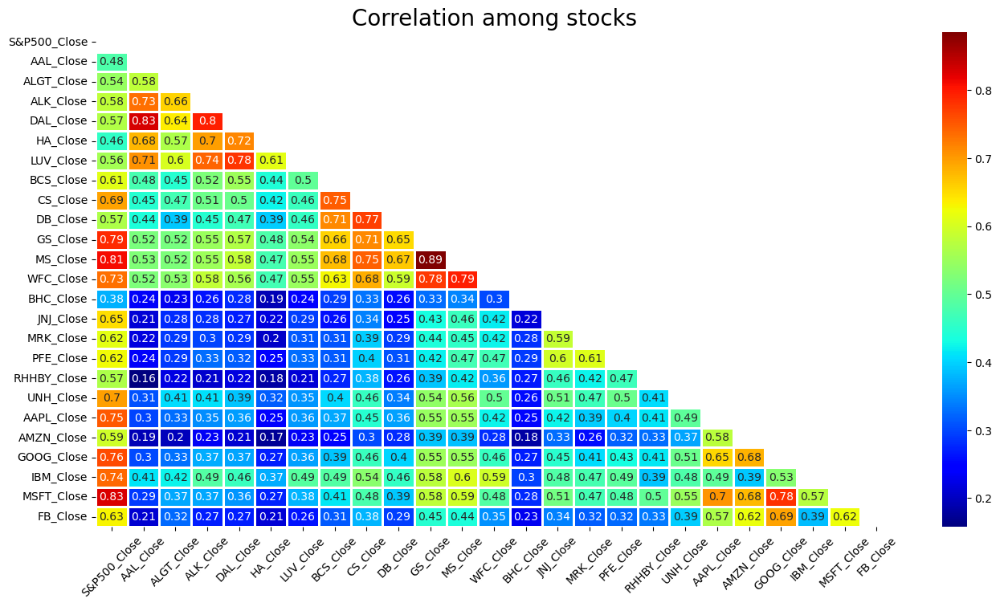

In [59]:
# correlation analysis of daily returns of the stock
plt.figure(figsize=(16,8))
mask = np.zeros_like(correlated_stocks)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlated_stocks, cmap='jet' ,mask=mask,linewidths=1.0,annot=True)
plt.yticks(rotation=0) ;
plt.xticks(rotation=45) ;
plt.title('Correlation among stocks', fontsize = 20);

**<font color= 'GREEN'>- Microsoft & Google stocks are highly correlated in the Techonolgy sector Stocks.**
    
**<font color= 'GREEN'>- Goldman Sachs, Morgan Stanley & WellsFargo are correlated in the Finance sector Stocks.**
    
**<font color= 'GREEN'>- American Airlines & Delta Airlines are more correlated than Alaska Air Group in the Aviation sector stocks.**
    
**<font color= 'GREEN'>- Pharma sector stocks are less correlated to each other when compared to other sector stocks.**

In [60]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are ignoring the first column S&P500 as it is the market index

# lets define the function to plot the graph

def dispersion_plot(stocks, addAll = True):
    fig = go.Figure()

    for column in stocks.columns.to_list()[1:]:
        fig.add_trace(
            go.Histogram(
                x = stocks[column],
                name = column
            )
            
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': stocks.columns[1:].isin(stocks.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': stocks.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(stocks.columns[1:].map(lambda column: stocks_layout_button(column)))
            )
        ])
    
# defining a slider option to increase or decrease the time period       
    fig.update_layout(title_text="Stock Price Dispersion from Mean",
                  xaxis_rangeslider_visible=True)
    fig.show()

    
#lets plot the graph
dispersion_plot(daily_returns)

**<font color= 'GREEN'> The graph illustrates the dispersion of each stock's values from the mean.**

### <font color= 'BLUE'> CUMMULATIVE DAILY RETURNS

In [61]:
# Lets Calculate the cumulative daily returns

cum_daily_return_df = (1 + daily_returns).cumprod() - 1

cum_daily_return_df.head()

,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close,BHC_Close,JNJ_Close,MRK_Close,PFE_Close,RHHBY_Close,UNH_Close,AAPL_Close,AMZN_Close,GOOG_Close,IBM_Close,MSFT_Close,FB_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.025553,0.006895,0.021520,0.012314
2015-10-05,0.032867,0.025255,-0.008808,0.008476,0.034133,0.031136,0.023171,0.039307,0.044417,0.063348,0.026588,0.025079,0.018857,-0.089866,0.017066,0.037675,0.051508,0.006622,0.026070,0.010951,0.044093,0.049371,0.037955,0.045281,0.033645
2015-10-06,0.029161,-0.027296,-0.043031,-0.071046,-0.007047,-0.019410,-0.010674,0.035976,0.053549,0.070890,0.024429,0.027302,0.011470,-0.075724,0.002683,0.008710,0.029837,0.009332,-0.004802,0.015788,0.032186,0.055866,0.036145,0.047971,0.020341
2015-10-07,0.037431,0.002806,-0.018993,-0.053097,0.012773,-0.006874,0.007810,0.047968,0.051059,0.085596,0.035280,0.045397,0.014580,-0.054399,0.019427,0.032003,0.045540,-0.020169,-0.001544,0.010951,0.040751,0.050827,0.045268,0.049092,0.015943


In [62]:
# Delete the null rows as they are not relevant for our calculations

daily_returns.dropna(axis = 0, inplace = True)
cum_daily_return_df.dropna(axis = 0, inplace = True)

In [63]:
cum_daily_return_df.head()

,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close,BHC_Close,JNJ_Close,MRK_Close,PFE_Close,RHHBY_Close,UNH_Close,AAPL_Close,AMZN_Close,GOOG_Close,IBM_Close,MSFT_Close,FB_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.025553,0.006895,0.021520,0.012314
2015-10-05,0.032867,0.025255,-0.008808,0.008476,0.034133,0.031136,0.023171,0.039307,0.044417,0.063348,0.026588,0.025079,0.018857,-0.089866,0.017066,0.037675,0.051508,0.006622,0.026070,0.010951,0.044093,0.049371,0.037955,0.045281,0.033645
2015-10-06,0.029161,-0.027296,-0.043031,-0.071046,-0.007047,-0.019410,-0.010674,0.035976,0.053549,0.070890,0.024429,0.027302,0.011470,-0.075724,0.002683,0.008710,0.029837,0.009332,-0.004802,0.015788,0.032186,0.055866,0.036145,0.047971,0.020341
2015-10-07,0.037431,0.002806,-0.018993,-0.053097,0.012773,-0.006874,0.007810,0.047968,0.051059,0.085596,0.035280,0.045397,0.014580,-0.054399,0.019427,0.032003,0.045540,-0.020169,-0.001544,0.010951,0.040751,0.050827,0.045268,0.049092,0.015943
2015-10-08,0.046579,0.013776,-0.024406,-0.055715,0.012112,0.054994,0.009112,0.053298,0.018265,0.070513,0.028690,0.047302,0.021384,-0.046938,0.020500,0.033421,0.039259,0.000903,-0.004545,-0.000730,0.023890,0.045592,0.060520,0.063663,0.016713


In [64]:
cum_daily_return_df.tail()

,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close,BHC_Close,JNJ_Close,MRK_Close,PFE_Close,RHHBY_Close,UNH_Close,AAPL_Close,AMZN_Close,GOOG_Close,IBM_Close,MSFT_Close,FB_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-24,0.687575,-0.699745,-0.442609,-0.555029,-0.361154,-0.498585,-0.040354,-0.683544,-0.600664,-0.694193,0.108454,0.479683,-0.546656,-0.915256,0.552753,0.684221,0.123116,0.345575,1.509733,2.950356,4.799259,1.336518,-0.177589,3.554808,1.743595
2020-09-25,0.714537,-0.686480,-0.432241,-0.542565,-0.344197,-0.482410,-0.034106,-0.686875,-0.606476,-0.698341,0.107545,0.493333,-0.540435,-0.914811,0.563379,0.679765,0.132224,0.349187,1.594117,3.098558,4.943943,1.363788,-0.171600,3.658597,1.801759
2020-09-28,0.742159,-0.674490,-0.416873,-0.532095,-0.309844,-0.458957,-0.004426,-0.667555,-0.589041,-0.682127,0.130951,0.535873,-0.536936,-0.914978,0.578942,0.676322,0.142902,0.327815,1.600377,3.196386,5.095503,1.395786,-0.152239,3.694911,1.823749
2020-09-29,0.733775,-0.687500,-0.444490,-0.542939,-0.325919,-0.479984,-0.020828,-0.669554,-0.591947,-0.688160,0.117998,0.499683,-0.547823,-0.917149,0.578405,0.658902,0.135992,0.305539,1.608267,3.164628,5.039484,1.403655,-0.157741,3.646043,1.878395
2020-09-30,0.748085,-0.686480,-0.450408,-0.543438,-0.326580,-0.478771,-0.023692,-0.666223,-0.586135,-0.683258,0.141745,0.534921,-0.542963,-0.913474,0.597939,0.680170,0.152638,0.288682,1.673613,3.227414,5.046878,1.404096,-0.152657,3.714862,1.879604


**<font color= 'GREEN'> To compute the total cumulative return for each stock over the entire period, you can utilize the last value in each column of the dataframe. By multiplying this last value by 100, you obtain the percentage change of the stock prices for the entire duration of the period under consideration.**

In [65]:
#selecting the last row and assigning it to a data frame
tot_cum_daily_return = cum_daily_return_df.tail(1)

tot_cum_daily_return

,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close,BHC_Close,JNJ_Close,MRK_Close,PFE_Close,RHHBY_Close,UNH_Close,AAPL_Close,AMZN_Close,GOOG_Close,IBM_Close,MSFT_Close,FB_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-30,0.748085,-0.68648,-0.450408,-0.543438,-0.32658,-0.478771,-0.023692,-0.666223,-0.586135,-0.683258,0.141745,0.534921,-0.542963,-0.913474,0.597939,0.68017,0.152638,0.288682,1.673613,3.227414,5.046878,1.404096,-0.152657,3.714862,1.879604


In [66]:
# lets round off the values by mulitplying with 100
tot_cum_daily_return = tot_cum_daily_return * 100

# lets check the dataframe
tot_cum_daily_return

,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close,BHC_Close,JNJ_Close,MRK_Close,PFE_Close,RHHBY_Close,UNH_Close,AAPL_Close,AMZN_Close,GOOG_Close,IBM_Close,MSFT_Close,FB_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-30,74.808459,-68.64796,-45.040827,-54.343762,-32.658005,-47.877072,-2.369175,-66.622252,-58.613533,-68.325792,14.174524,53.492057,-54.296267,-91.347439,59.793934,68.017012,15.263822,28.868151,167.361278,322.741369,504.68777,140.40963,-15.265686,371.486208,187.960421


In [67]:
# Lets reset the index
tot_cum_daily_return = tot_cum_daily_return.reset_index().transpose()

# Removing the date row & selecting only the stocks as per our requirement
tot_cum_daily_return = tot_cum_daily_return[1:]

In [68]:
# Renaming the column from zero to cumulative Returns
tot_cum_daily_return = tot_cum_daily_return.rename(columns = {0: 'Cumulative Returns'}, inplace = False)

# Sorting the values by descending order
tot_cum_daily_return = tot_cum_daily_return.sort_values('Cumulative Returns', ascending = False)

# lets check the dataframe
tot_cum_daily_return

,Cumulative Returns
AMZN_Close,504.68777
MSFT_Close,371.486208
AAPL_Close,322.741369
FB_Close,187.960421
UNH_Close,167.361278
GOOG_Close,140.40963
S&P500_Close,74.808459
MRK_Close,68.017012
JNJ_Close,59.793934
MS_Close,53.492057


In [69]:
# checking dtype of tot_cum_daily_return
tot_cum_daily_return.dtypes

Cumulative Returns    object
dtype: object

In [70]:
# changing the datatype to float from object and round off to 2 decimal places for easy understanding
tot_cum_daily_return['Cumulative Returns'] = round(tot_cum_daily_return['Cumulative Returns'].astype(float, errors = 'raise'),2)

# checking the dataframe
tot_cum_daily_return

,Cumulative Returns
AMZN_Close,504.69
MSFT_Close,371.49
AAPL_Close,322.74
FB_Close,187.96
UNH_Close,167.36
GOOG_Close,140.41
S&P500_Close,74.81
MRK_Close,68.02
JNJ_Close,59.79
MS_Close,53.49


**<font color= 'GREEN'> - Positive cumulative returns typically signal favorable stock performance, while negative cumulative returns imply a decline in value.**
    
**<font color= 'GREEN'> - Notably, Amazon (AMZN), Microsoft (MSFT), Apple (AAPL), and Facebook (FB) exhibit significant positive cumulative returns, indicating substantial gains over the period analyzed. Therefore, it can be concluded that technology stocks, represented by these companies, are yielding high cumulative returns overall.**    

### <font color= 'BLUE'> Calculation of Sharp Ratio, Annual Risk & Annual Returns

In [71]:
#Check the quantitative spread of daily_returns
daily_returns.describe()

,S&P500_Close,AAL_Close,ALGT_Close,ALK_Close,DAL_Close,HA_Close,LUV_Close,BCS_Close,CS_Close,DB_Close,GS_Close,MS_Close,WFC_Close,BHC_Close,JNJ_Close,MRK_Close,PFE_Close,RHHBY_Close,UNH_Close,AAPL_Close,AMZN_Close,GOOG_Close,IBM_Close,MSFT_Close,FB_Close
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,0.000517,-0.000336,-0.000047,-0.000256,0.000042,0.000034,0.000245,-0.000548,-0.000437,-0.000529,0.000303,0.000578,-0.000414,-0.000897,0.000451,0.000511,0.000209,0.000293,0.000941,0.001322,0.001611,0.000834,-0.000002,0.001387,0.001050
std,0.012080,0.034725,0.029101,0.026907,0.026478,0.033132,0.022913,0.025119,0.022842,0.027743,0.019899,0.021810,0.020349,0.044551,0.012459,0.014067,0.013826,0.013514,0.017810,0.018729,0.018969,0.016520,0.016086,0.017539,0.020354
min,-0.119841,-0.252246,-0.283300,-0.232385,-0.259924,-0.264971,-0.151094,-0.218519,-0.182598,-0.174888,-0.127053,-0.156000,-0.158676,-0.514629,-0.100379,-0.088990,-0.077346,-0.089609,-0.172769,-0.128647,-0.079221,-0.111008,-0.128507,-0.147390,-0.189609
25%,-0.002938,-0.013623,-0.011305,-0.010721,-0.009714,-0.014908,-0.009222,-0.010787,-0.010442,-0.014976,-0.008386,-0.009023,-0.007917,-0.019678,-0.004277,-0.006240,-0.005856,-0.006237,-0.006644,-0.006179,-0.006716,-0.005788,-0.006498,-0.005893,-0.007223
50%,0.000682,-0.000480,-0.000363,0.000206,0.000783,0.000342,0.000618,0.000000,0.000000,-0.001051,0.000299,0.000445,-0.000362,-0.000501,0.000493,0.000245,0.000115,0.000229,0.000809,0.000951,0.001636,0.000973,0.000483,0.001225,0.001193
75%,0.005213,0.013233,0.011630,0.010619,0.009781,0.015078,0.009990,0.010215,0.010416,0.013872,0.009704,0.010451,0.007589,0.018022,0.005921,0.007616,0.006372,0.006919,0.008161,0.009911,0.010765,0.008785,0.006879,0.009161,0.010880
max,0.093828,0.410970,0.292428,0.203079,0.210171,0.245837,0.144441,0.151042,0.163447,0.140244,0.175803,0.197700,0.145347,0.337444,0.079977,0.104080,0.089607,0.130118,0.127989,0.119808,0.132164,0.104485,0.113011,0.142169,0.155214


In [72]:
# Mean and standard deviation of all the stocks 
daily_return_df = daily_returns.describe()[1:8].T.sort_values('mean', ascending = False)

# dropping the unnecessary columns
msd_df = daily_return_df[['mean','std','min','max']]

# Renaming the columns names 
msd_df = msd_df.rename(columns = {'mean': 'Avg Daily Returns', 'std':'Risk', "min": "Min", "max" : "Max" }, inplace = False)

# lets check the dataframe
msd_df

,Avg Daily Returns,Risk,Min,Max
AMZN_Close,0.001611,0.018969,-0.079221,0.132164
MSFT_Close,0.001387,0.017539,-0.147390,0.142169
AAPL_Close,0.001322,0.018729,-0.128647,0.119808
FB_Close,0.001050,0.020354,-0.189609,0.155214
UNH_Close,0.000941,0.017810,-0.172769,0.127989
GOOG_Close,0.000834,0.016520,-0.111008,0.104485
MS_Close,0.000578,0.021810,-0.156000,0.197700
S&P500_Close,0.000517,0.012080,-0.119841,0.093828
MRK_Close,0.000511,0.014067,-0.088990,0.104080
JNJ_Close,0.000451,0.012459,-0.100379,0.079977


In [73]:
# calculating Annualized Returns

# As per the industry practice here we take 252 days as the number of working days of a stock market 
msd_df["Annualized_Returns"] = msd_df["Avg Daily Returns"]*252

#Lets calculate Annualized risk
msd_df["Annualized_Risk"] = np.sqrt(252) * msd_df["Risk"]

In [74]:
# considering the risk free rate as 0.75%.
msd_df["Sharpe_Ratio"] = ((msd_df["Annualized_Returns"] - 0.0075) / msd_df["Annualized_Risk"]) / 100 

# lets see the dataframe
msd_df

,Avg Daily Returns,Risk,Min,Max,Annualized_Returns,Annualized_Risk,Sharpe_Ratio
AMZN_Close,0.001611,0.018969,-0.079221,0.132164,0.405855,0.301117,0.013229
MSFT_Close,0.001387,0.017539,-0.147390,0.142169,0.349535,0.278430,0.012284
AAPL_Close,0.001322,0.018729,-0.128647,0.119808,0.333182,0.297317,0.010954
FB_Close,0.001050,0.020354,-0.189609,0.155214,0.264524,0.323113,0.007955
UNH_Close,0.000941,0.017810,-0.172769,0.127989,0.237197,0.282731,0.008124
GOOG_Close,0.000834,0.016520,-0.111008,0.104485,0.210194,0.262253,0.007729
MS_Close,0.000578,0.021810,-0.156000,0.197700,0.145536,0.346215,0.003987
S&P500_Close,0.000517,0.012080,-0.119841,0.093828,0.130407,0.191765,0.006409
MRK_Close,0.000511,0.014067,-0.088990,0.104080,0.128832,0.223306,0.005433
JNJ_Close,0.000451,0.012459,-0.100379,0.079977,0.113527,0.197781,0.005361


In [75]:
# rounding off the values by mulitplying with 100
msd_df = msd_df*100

# rounding off the values by 2 decimal points for easy refernce
msd_df = round(msd_df, 2)

# lets check the dataframe
msd_df

,Avg Daily Returns,Risk,Min,Max,Annualized_Returns,Annualized_Risk,Sharpe_Ratio
AMZN_Close,0.16,1.90,-7.92,13.22,40.59,30.11,1.32
MSFT_Close,0.14,1.75,-14.74,14.22,34.95,27.84,1.23
AAPL_Close,0.13,1.87,-12.86,11.98,33.32,29.73,1.10
FB_Close,0.10,2.04,-18.96,15.52,26.45,32.31,0.80
UNH_Close,0.09,1.78,-17.28,12.80,23.72,28.27,0.81
GOOG_Close,0.08,1.65,-11.10,10.45,21.02,26.23,0.77
MS_Close,0.06,2.18,-15.60,19.77,14.55,34.62,0.40
S&P500_Close,0.05,1.21,-11.98,9.38,13.04,19.18,0.64
MRK_Close,0.05,1.41,-8.90,10.41,12.88,22.33,0.54
JNJ_Close,0.05,1.25,-10.04,8.00,11.35,19.78,0.54


In [76]:
msd_df_final = pd.concat([msd_df,tot_cum_daily_return], axis=1)

msd_df_final

,Avg Daily Returns,Risk,Min,Max,Annualized_Returns,Annualized_Risk,Sharpe_Ratio,Cumulative Returns
AMZN_Close,0.16,1.90,-7.92,13.22,40.59,30.11,1.32,504.69
MSFT_Close,0.14,1.75,-14.74,14.22,34.95,27.84,1.23,371.49
AAPL_Close,0.13,1.87,-12.86,11.98,33.32,29.73,1.10,322.74
FB_Close,0.10,2.04,-18.96,15.52,26.45,32.31,0.80,187.96
UNH_Close,0.09,1.78,-17.28,12.80,23.72,28.27,0.81,167.36
GOOG_Close,0.08,1.65,-11.10,10.45,21.02,26.23,0.77,140.41
MS_Close,0.06,2.18,-15.60,19.77,14.55,34.62,0.40,53.49
S&P500_Close,0.05,1.21,-11.98,9.38,13.04,19.18,0.64,74.81
MRK_Close,0.05,1.41,-8.90,10.41,12.88,22.33,0.54,68.02
JNJ_Close,0.05,1.25,-10.04,8.00,11.35,19.78,0.54,59.79


- <font color= 'GREEN'> AMZN gives 40.59% annual returns
- <font color= 'GREEN'>MSFT gives 34.95% annual returns
- <font color= 'GREEN'>AAPL gives 33.32% annual returns
- <font color= 'GREEN'>FB gives 26.45% annual returns
- <font color= 'GREEN'>UNH gives 23.72% annual returns
- <font color= 'GREEN'>GOOG gives 21.02% annual returns
- <font color= 'GREEN'>MS gives 14.55% annual returns
- <font color= 'GREEN'>S&P500 gives 13.04% annual returns
- <font color= 'GREEN'>Amazon (AMZN), Microsoft (MSFT), and Apple (AAPL) demonstrate relatively high annualized returns, low volatility, and positive Sharpe Ratios, highlighting robust risk-adjusted performance.
- <font color= 'GREEN'>Conversely, stocks such as Wells Fargo (WFC), Credit Suisse (CS), and Deutsche Bank (DB) exhibit negative cumulative returns, indicating losses over the specified period. Additionally, these stocks have negative Sharpe Ratios, signifying poor risk-adjusted performance.
- <font color= 'GREEN'>Notably, Bausch Health Companies Inc. (BHC) and American Airlines (AAL) show the most substantial negative cumulative returns, implying significant losses in their respective performance metrics.

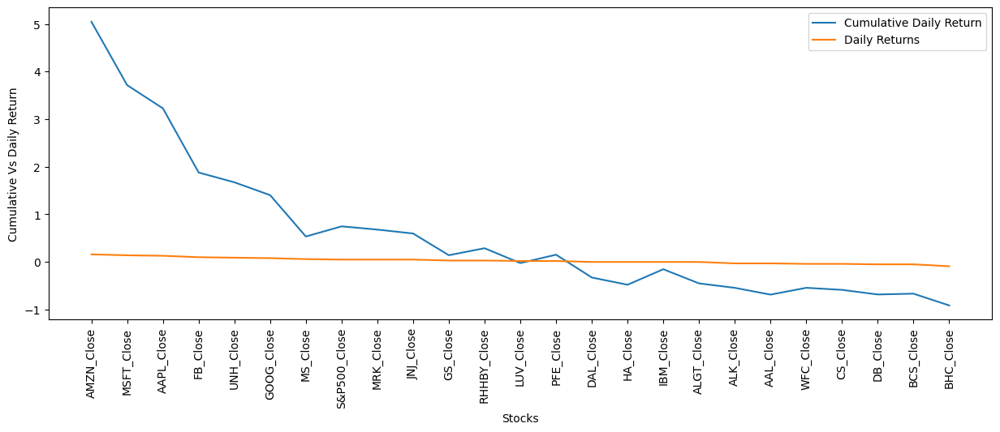

In [77]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))

sns.lineplot(data=msd_df_final['Cumulative Returns']/100, label="Cumulative Daily Return")

sns.lineplot(data=msd_df_final['Avg Daily Returns'], label="Daily Returns")


# Add label for horizontal axis
plt.xlabel("Stocks");

#rotate the label
plt.xticks(rotation = 90);

# Add label for horizontal axis
plt.ylabel("Cumulative Vs Daily Return");

#plt.show()

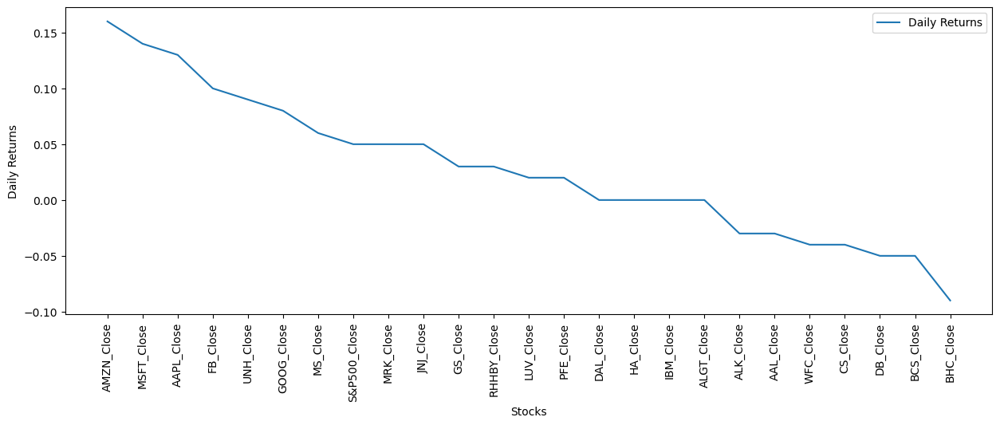

In [78]:
# Line chart showing daily returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=msd_df_final['Avg Daily Returns'], label="Daily Returns")

# Add label for horizontal axis
plt.xlabel("Stocks");

#rotate the labels
plt.xticks(rotation = 90);

# Add label for horizontal axis
plt.ylabel("Daily Returns");

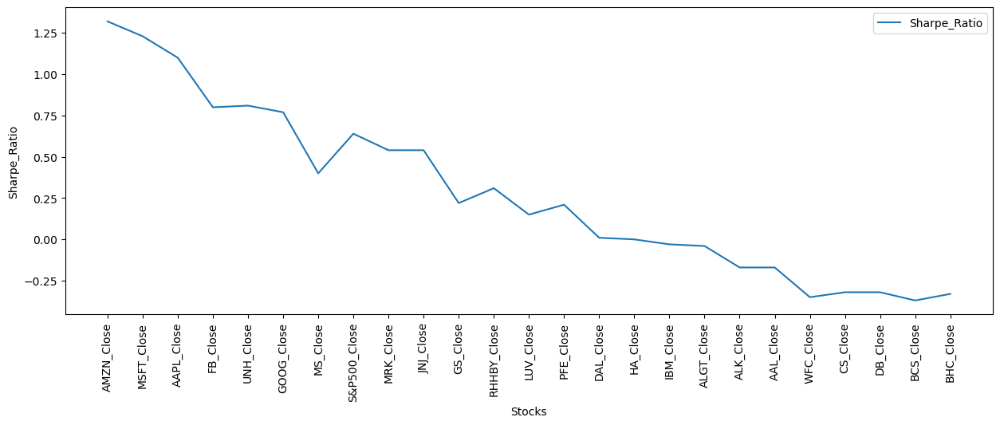

In [79]:
# Line chart showing Sharpe ratio of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=msd_df_final['Sharpe_Ratio'], label="Sharpe_Ratio")
# Add label for horizontal axis
plt.xlabel("Stocks");
#rotate the labels
plt.xticks(rotation = 90);

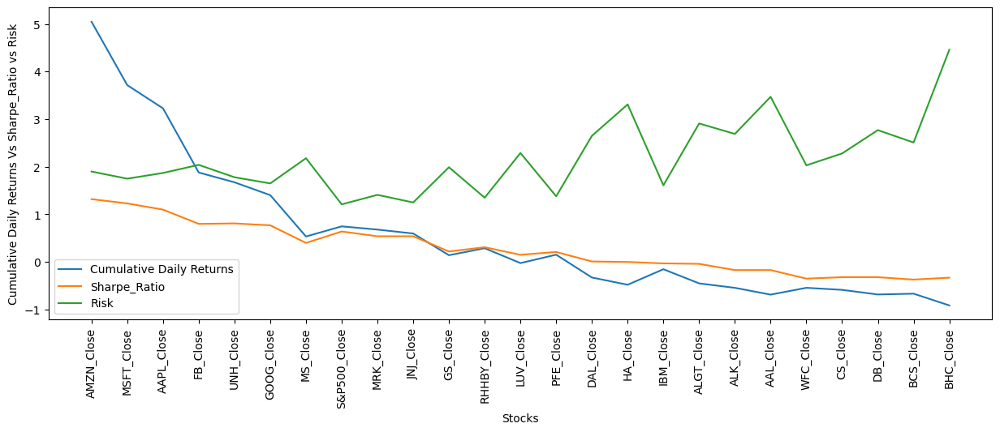

In [80]:
# Line chart showing returns,sharperatio and risk

plt.figure(figsize=(15,5))
sns.lineplot(data=msd_df_final['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=msd_df_final['Sharpe_Ratio'], label="Sharpe_Ratio")
sns.lineplot(data=msd_df_final['Risk'], label="Risk")


# Add label for horizontal axis
plt.xlabel("Stocks");

#rotate the labels
plt.xticks(rotation = 90);

# Add label for horizontal axis
plt.ylabel("Cumulative Daily Returns Vs Sharpe_Ratio vs Risk");

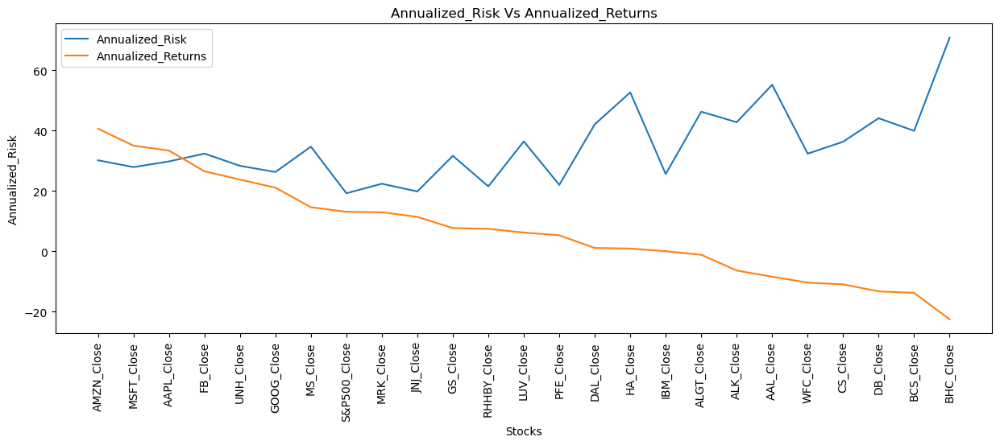

In [81]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=msd_df_final['Annualized_Risk'], label="Annualized_Risk")
sns.lineplot(data=msd_df_final['Annualized_Returns'], label="Annualized_Returns")


# Add label for horizontal axis
plt.xlabel("Stocks");

#rotate the labels
plt.xticks(rotation = 90);

# Add label for horizontal axis
plt.title("Annualized_Risk Vs Annualized_Returns");

## <font color= 'Blue'> PORTFOLIO ANALYSIS:

###  <font color = 'green'> BUILDING MR. PATRICK JYENGAR PORTFOLIO 

- Mr Patrick Jyengar wants to maintain a decent standard of living post his retirement
- He has always been a **conservative investor** during his life
- He want to invest 500K in equities and expects doubling his capital with less risk in 5 years of time
- Mr. Patrick Jyengar, a conservative investor, is considering low-risk stocks like JNJ, RHHBY, PFE, and MRK
- Three out of the four selected stocks are from the healthcare industry, with one being pharmaceutical.
- PFE from the healthcare sector is generating lower returns compared to others. Consequently, PFE is not being considered for inclusion in this portfolio.
- Diversification is desired, but high-risk industries like technology and finance are not suitable for a conservative portfolio.
- Two technology stocks, MSFT and GOOG, exhibit slightly lower risk compared to others in the sector.
- These technology stocks could be considered to complement the portfolio while still aligning with Mr. Jyengar's investment goals.

In [82]:
# Initial allocation percentages for each stock in sequence:
Portfolio_stocks = ['JNJ_Close', 'RHHBY_Close' ,'MRK_Close', 'MSFT_Close']

initial_weight = np.array([0.25, 0.25, 0.25, 0.25])

In [83]:
Patrick_Portfolio = stocks_close[Portfolio_stocks]
Patrick_Portfolio.head()

,JNJ_Close,RHHBY_Close,MRK_Close,MSFT_Close
Date,,,,
2015-10-01,93.169998,33.220001,49.369999,44.610001
2015-10-02,93.930000,33.320000,50.139999,45.570000
2015-10-05,94.760002,33.439999,51.230000,46.630001
2015-10-06,93.419998,33.529999,49.799999,46.750000
2015-10-07,94.980003,32.549999,50.950001,46.799999


In [84]:
Patrick_Portfolio.tail()

,JNJ_Close,RHHBY_Close,MRK_Close,MSFT_Close
Date,,,,
2020-09-24,144.669998,44.700001,83.150002,203.190002
2020-09-25,145.660004,44.820000,82.930000,207.820007
2020-09-28,147.110001,44.110001,82.760002,209.440002
2020-09-29,147.059998,43.369999,81.900002,207.259995
2020-09-30,148.880005,42.810001,82.949997,210.330002


### <font color = 'green'> CALCULATING DAILY RETURNS FROM EACH STOCK:

**<FONT COLOR = "GREEN">The daily return of a stock represents the percentage change in its price compared to the previous day. It is calculated by determining the percentage change in the stock's price on a daily basis, providing insight into its day-to-day performance and volatility in the market.**

In [85]:
Stocks_Daily_returns = Patrick_Portfolio.pct_change()
Stocks_Daily_returns.head()

,JNJ_Close,RHHBY_Close,MRK_Close,MSFT_Close
Date,,,,
2015-10-01,NaN,NaN,NaN,NaN
2015-10-02,0.008157,0.003010,0.015597,0.021520
2015-10-05,0.008836,0.003601,0.021739,0.023261
2015-10-06,-0.014141,0.002691,-0.027913,0.002573
2015-10-07,0.016699,-0.029228,0.023092,0.001069


### <font color= 'green' > CALCULATING AVERAGE DAILY RETURNS

In [86]:
# Average daily returns
average_stocks_daily_returns = Stocks_Daily_returns.mean()
print(average_stocks_daily_returns)

JNJ_Close      0.000451
RHHBY_Close    0.000293
MRK_Close      0.000511
MSFT_Close     0.001387
dtype: float64


**<FONT COLOR = "GREEN">Microsoft has high average returns**

### <font color= 'green' > CALCULATING STOCKS RISK:

In [87]:
risk = Stocks_Daily_returns.std()
print(risk)

JNJ_Close      0.012459
RHHBY_Close    0.013514
MRK_Close      0.014067
MSFT_Close     0.017539
dtype: float64


### <font color= 'green' > CALCULATING DAILY RETURNS FROM PORTFOLIO:

**<FONT COLOR = "GREEN">To ascertain the daily return of the portfolio, a weighted average can be computed based on the returns of individual stocks within the portfolio. This method accounts for the contribution of each stock's return proportionate to its weighting in the portfolio, offering a consolidated measure of the portfolio's performance on a daily basis.**

In [88]:
# Daily returns from portfolio

Stocks_Daily_returns['portfolio_daily_returns'] = Stocks_Daily_returns.dot(initial_weight)

In [89]:
Stocks_Daily_returns.head(10)

,JNJ_Close,RHHBY_Close,MRK_Close,MSFT_Close,portfolio_daily_returns
Date,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.008157,0.003010,0.015597,0.021520,0.012071
2015-10-05,0.008836,0.003601,0.021739,0.023261,0.014359
2015-10-06,-0.014141,0.002691,-0.027913,0.002573,-0.009197
2015-10-07,0.016699,-0.029228,0.023092,0.001069,0.002908
2015-10-08,0.001053,0.021505,0.001374,0.013889,0.009455
2015-10-09,0.003050,-0.011729,-0.001372,-0.007165,-0.004304
2015-10-12,0.006501,0.004260,-0.004711,-0.002335,0.000929
2015-10-13,-0.005626,0.005455,-0.024453,-0.002340,-0.006741


### <font color= 'green' > CALCULATING PORTFOLIO RETURNS:

In [90]:
# calculating the total portfolio returns

allocated_stocks_daily_returns = (initial_weight * average_stocks_daily_returns)

portfolio_return = np.sum(allocated_stocks_daily_returns)
portfolio_return*100

0.06603738600705662

**<FONT COLOR = "GREEN">Average Daily Returns of Portfolio is 0.06%**

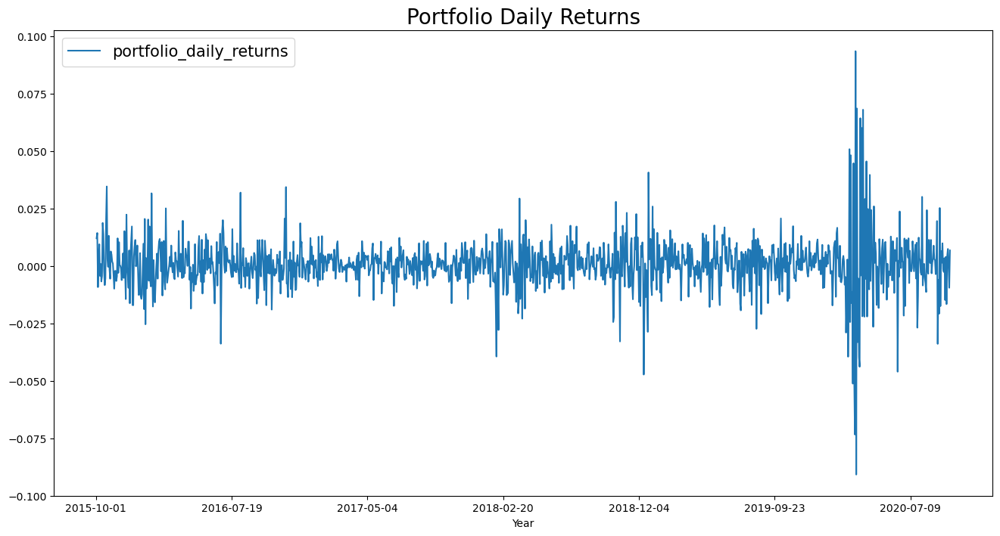

In [91]:
# Lets Plot the graph
plt.figure(figsize=(16,8))
Stocks_Daily_returns['portfolio_daily_returns'].plot()
plt.title('Portfolio Daily Returns', fontsize = 20);
plt.legend(loc = 'best', fontsize = 15);
plt.xticks(rotation=0);
plt.xlabel("Year");
plt.show();

### <font color= 'green' > CUMULATIVE RETURNS OF PORTFOLIO

**<FONT COLOR = "GREEN">Cumulative return of an investment is the cumulative gain or loss from an investment over the given period of time**

In [92]:
# Cumulative returns

daily_cumulative_returns = (1+Stocks_Daily_returns).cumprod()
daily_cumulative_returns.tail()

,JNJ_Close,RHHBY_Close,MRK_Close,MSFT_Close,portfolio_daily_returns
Date,,,,,
2020-09-24,1.552753,1.345575,1.684221,4.554808,2.106791
2020-09-25,1.563379,1.349187,1.679765,4.658597,2.122417
2020-09-28,1.578942,1.327815,1.676322,4.694911,2.122342
2020-09-29,1.578405,1.305539,1.658902,4.646043,2.102224
2020-09-30,1.597939,1.288682,1.680170,4.714862,2.116465


**<FONT COLOR = "GREEN">This shows that the portfolio has achieved a cumulative return of 2.11% in the given period**

### <font color= 'green' > PLOTTING A GRAPH

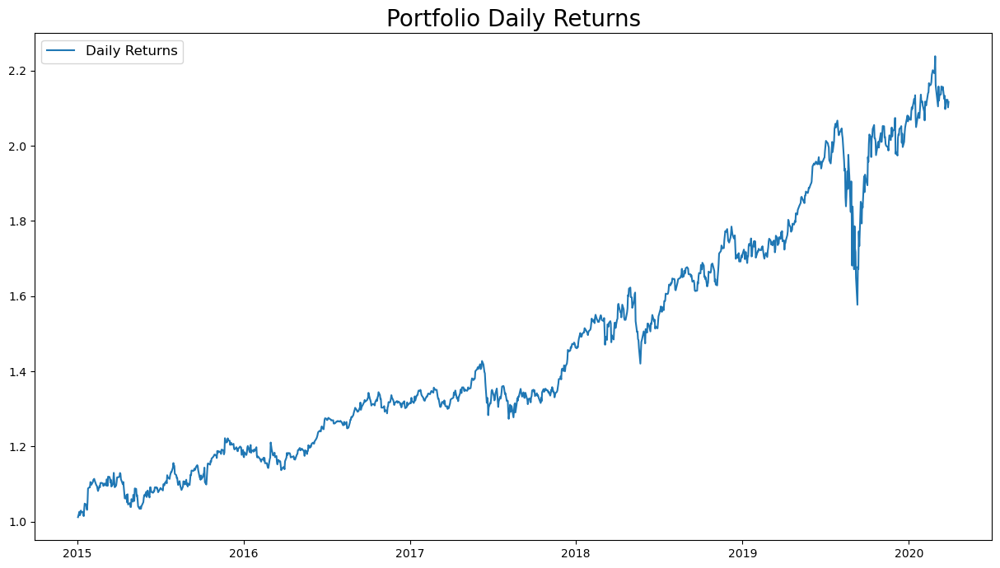

In [93]:
# Lets Plot the graph
daily_cumulative_returns.index = pd.to_datetime(daily_cumulative_returns.index)
plt.figure(figsize=(15,8))
plt.plot(daily_cumulative_returns['portfolio_daily_returns'], label = 'Daily Returns')
plt.title('Portfolio Daily Returns', fontsize = 20);
plt.legend(loc = 'best', fontsize = 12);
plt.xticks(daily_cumulative_returns.index[::240], [x.year for x in daily_cumulative_returns.index[::240]]);
plt.show();

### <FONT COLOR = "GREEN"> PORTFOLO RISK - PORTFOLIO STANDARD DEVIATION

- To calculate the portfolio standard deviation, we require three elements:
    - Portfolio weight array
    - Transpose of the portfolio weight array
    - Portfolio covariance matrix
    
The weights for each stock in the portfolio are already available. We need to compute the daily covariance. It's important to note that the covariance must be annualized by multiplying it by 252 (the number of trading days in a year).

In [94]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio = Stocks_Daily_returns.iloc[:,:-1]
covariance_matrix_portfolio = (covariance_matrix_portfolio.cov())*252

covariance_matrix_portfolio

,JNJ_Close,RHHBY_Close,MRK_Close,MSFT_Close
JNJ_Close,0.039117,0.019560,0.025844,0.028277
RHHBY_Close,0.019560,0.046023,0.020306,0.029796
MRK_Close,0.025844,0.020306,0.049865,0.029374
MSFT_Close,0.028277,0.029796,0.029374,0.077524


In [95]:
# Applying the matrix operations mentioned above


portfolio_variance = np.dot(initial_weight.T,np.dot(covariance_matrix_portfolio, initial_weight))

In [96]:
# Portfolio Risk (standard deviation)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk*100

18.00773538749593

### <FONT COLOR = "GREEN">SHARPE RATIO

In [97]:
# Assuming that the risk free rate is zero
Sharpe_Ratio = (Stocks_Daily_returns['portfolio_daily_returns'].mean() - daily_returns['S&P500_Close'].mean()) / Stocks_Daily_returns['portfolio_daily_returns'].std()
Sharpe_Ratio

0.012596079178261308

In [98]:
# Annualisaed Sharpe ratio
Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
Annualised_Sharpe_Ratio

0.1999565580009495

### <FONT COLOR = "GREEN">TOTAL RETURN OF INVESTMENT FROM THE PORTFOLIO

In [99]:
invested_amount=500000
Cummulative_returns=daily_cumulative_returns['portfolio_daily_returns'][-1]
Expected_Return=invested_amount*Cummulative_returns
Expected_Return

1058232.526596431

In [100]:
Expected_Earning=Expected_Return-invested_amount
Expected_Earning

558232.5265964309

### <FONT COLOR = "GREEN">INSIGHT


**<FONT COLOR = "GREEN"> Mr. Patrick Jyengar invests 500000 Dollar in equities, comprising the portfolio mentioned earlier. After 5 years, he expects his investment to yield 1.05 million Dollars, reflecting a gain of 558.23 thousand Dollars. This gain represents the appreciation in the value of his investment over the specified period.**

##  <font color = 'green'> BUILDING MR. PETER JYENGAR PORTFOLIO 

- Mr. Peter Jyengar, consistent with his risk-tolerant approach, favors high-return investments.
- He maintains confidence in his ability to recover from occasional losses.
- Mr. Jyengar intends to invest 1 million dolors from the company's cash and cash equivalents.
- His objective is to invest in stocks with high margins.
- He anticipates significant returns within a 5-year timeframe to facilitate the inorganic expansion of JWW.
- Mr. Peter Jyengar's investment profile favors high-risk, high-return stocks such as AMZN, MSFT, AAPL
- However, FB presents high risk with comparatively lower returns, so it's excluded from the portfolio.
- The chosen portfolio aims to maximize returns while managing risk effectively.


In [101]:
# Initial weight for each stock

Peter_Portfolio_stocks = ['AMZN_Close', 'AAPL_Close' , 'MSFT_Close']

Peter_initial_weight = np.array([0.333, 0.333, 0.334])

In [102]:
# Lets select the data from our total stocks data

Peter_portfolio = stocks_close[Peter_Portfolio_stocks]
Peter_portfolio.head()

,AMZN_Close,AAPL_Close,MSFT_Close
Date,,,
2015-10-01,520.719971,27.395000,44.610001
2015-10-02,532.539978,27.594999,45.570000
2015-10-05,543.679993,27.695000,46.630001
2015-10-06,537.479980,27.827499,46.750000
2015-10-07,541.940002,27.695000,46.799999


In [103]:
Peter_portfolio.tail()

,AMZN_Close,AAPL_Close,MSFT_Close
Date,,,
2020-09-24,3019.790039,108.220001,203.190002
2020-09-25,3095.129883,112.279999,207.820007
2020-09-28,3174.050049,114.959999,209.440002
2020-09-29,3144.879883,114.089996,207.259995
2020-09-30,3148.729980,115.809998,210.330002


### <font color = 'green'> CALCULATING DAILY RETURNS FROM EACH STOCK:

**The daily return represents the percentage change in the stock price from the previous day. It is calculated by determining the percentage change in price on a daily basis**

In [104]:
Stocks_Daily_returns = Peter_portfolio.pct_change()
Stocks_Daily_returns.head()

,AMZN_Close,AAPL_Close,MSFT_Close
Date,,,
2015-10-01,NaN,NaN,NaN
2015-10-02,0.022699,0.007301,0.021520
2015-10-05,0.020919,0.003624,0.023261
2015-10-06,-0.011404,0.004784,0.002573
2015-10-07,0.008298,-0.004761,0.001069


### <font color= 'green' > CALCULATING AVERAGE DAILY RETURNS

In [105]:
# Average daily returns
average_stocks_daily_returns = Stocks_Daily_returns.mean()
print(average_stocks_daily_returns)

AMZN_Close    0.001611
AAPL_Close    0.001322
MSFT_Close    0.001387
dtype: float64


**<FONT COLOR = "GREEN">Amazon has high average returns**

### <font color= 'green' > CALCULATING STOCKS RISK:

In [106]:
risk = Stocks_Daily_returns.std()
print(risk)

AMZN_Close    0.018969
AAPL_Close    0.018729
MSFT_Close    0.017539
dtype: float64


### <font color= 'green' > CALCULATING DAILY RETURNS FROM PORTFOLIO:

**<FONT COLOR = "GREEN">To ascertain the daily return of the portfolio, a weighted average can be computed based on the returns of individual stocks within the portfolio. This method accounts for the contribution of each stock's return proportionate to its weighting in the portfolio, offering a consolidated measure of the portfolio's performance on a daily basis.**

In [107]:
# Daily returns from portfolio

Stocks_Daily_returns['portfolio_daily_returns'] = Stocks_Daily_returns.dot(Peter_initial_weight)

In [108]:
Stocks_Daily_returns.head()

,AMZN_Close,AAPL_Close,MSFT_Close,portfolio_daily_returns
Date,,,,
2015-10-01,NaN,NaN,NaN,NaN
2015-10-02,0.022699,0.007301,0.021520,0.017178
2015-10-05,0.020919,0.003624,0.023261,0.015942
2015-10-06,-0.011404,0.004784,0.002573,-0.001345
2015-10-07,0.008298,-0.004761,0.001069,0.001535


### <font color= 'green' > CALCULATING PORTFOLIO RETURNS:

In [109]:
# calculating the total portfolio returns

allocated_stocks_daily_returns = (Peter_initial_weight * average_stocks_daily_returns)

portfolio_return = np.sum(allocated_stocks_daily_returns)
portfolio_return*100

0.14398564304226308

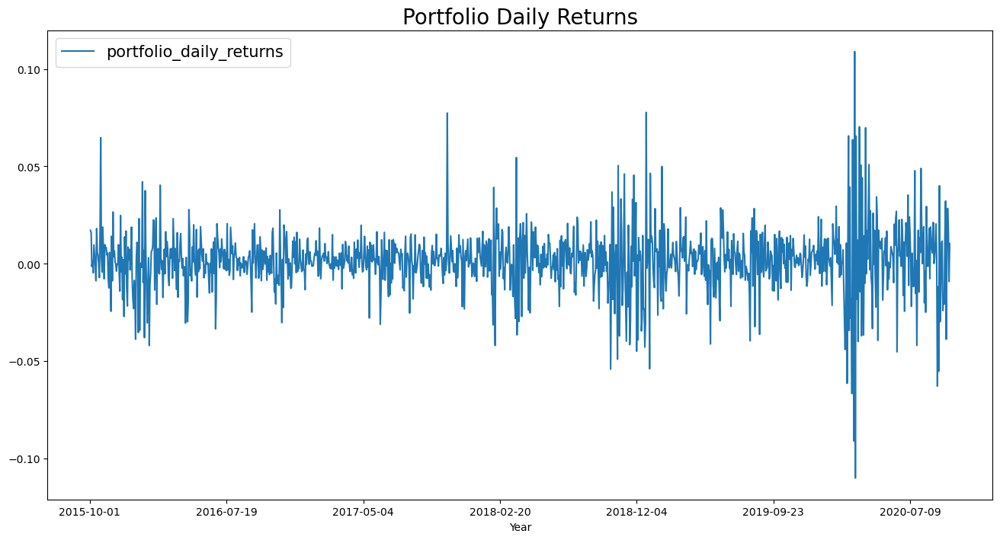

In [110]:
# Lets Plot the graph
plt.figure(figsize=(16,8))
Stocks_Daily_returns['portfolio_daily_returns'].plot()
plt.title('Portfolio Daily Returns', fontsize = 20);
plt.legend(loc = 'best', fontsize = 15);
plt.xticks(rotation=0);
plt.xlabel("Year");
plt.show();

### <FONT COLOR = "GREEN"> CUMULATIVE RETURN FROM PORTFOLIO

**<FONT COLOR = "GREEN">Cumulative return of an investment is the cumulative gain or loss from an investment over the given period of time**

In [111]:
# Cumulative returns

daily_cumulative_returns = (1+Stocks_Daily_returns).cumprod()
daily_cumulative_returns

,AMZN_Close,AAPL_Close,MSFT_Close,portfolio_daily_returns
Date,,,,
2015-10-01,NaN,NaN,NaN,NaN
2015-10-02,1.022699,1.007301,1.021520,1.017178
2015-10-05,1.044093,1.010951,1.045281,1.033393
2015-10-06,1.032186,1.015788,1.047971,1.032004
2015-10-07,1.040751,1.010951,1.049092,1.033588
...,...,...,...,...
2020-09-24,5.799259,3.950356,4.554808,4.946126
2020-09-25,5.943943,4.098558,4.658597,5.086652
2020-09-28,6.095503,4.196386,4.694911,5.183517


**<FONT COLOR = "GREEN">This shows that the portfolio has achieved a cumulative return of 5.427% in the given period**

### <font color= 'green' > PLOTTING A GRAPH

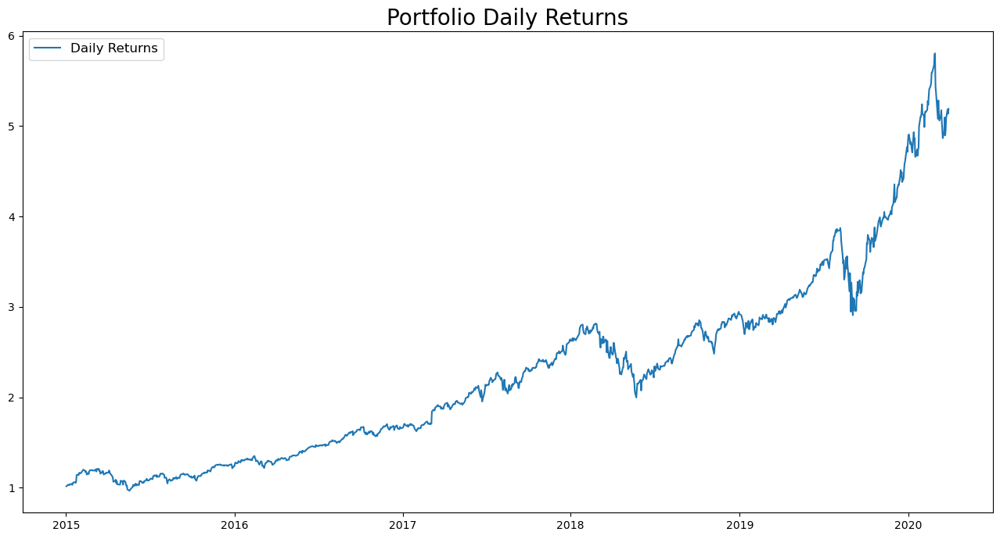

In [112]:
# Lets Plot the graph
daily_cumulative_returns.index = pd.to_datetime(daily_cumulative_returns.index)
plt.figure(figsize=(16,8))
plt.plot(daily_cumulative_returns['portfolio_daily_returns'], label = 'Daily Returns')
plt.title('Portfolio Daily Returns', fontsize = 20);
plt.legend(loc = 'best', fontsize = 12);
plt.xticks(daily_cumulative_returns.index[::240], [x.year for x in daily_cumulative_returns.index[::240]]);
plt.show();

### <FONT COLOR = "GREEN"> PORTFOLO RISK - PORTFOLIO STANDARD DEVIATION

- To calculate the portfolio standard deviation, we require three elements:
    - Portfolio weight array
    - Transpose of the portfolio weight array
    - Portfolio covariance matrix
    
The weights for each stock in the portfolio are already available. We need to compute the daily covariance. It's important to note that the covariance must be annualized by multiplying it by 252 (the number of trading days in a year).

In [113]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio = Stocks_Daily_returns.iloc[:,:-1]
covariance_matrix_portfolio = (covariance_matrix_portfolio.cov())*252

covariance_matrix_portfolio

,AMZN_Close,AAPL_Close,MSFT_Close
AMZN_Close,0.090671,0.051597,0.056626
AAPL_Close,0.051597,0.088398,0.058350
MSFT_Close,0.056626,0.058350,0.077524


In [114]:
# Applying the matrix operations mentioned above

portfolio_variance = np.dot(Peter_initial_weight.T,np.dot(covariance_matrix_portfolio, Peter_initial_weight))

In [115]:
# Portfolio Risk (standard deviation)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk*100

25.597623985420228

### <FONT COLOR = "GREEN">SHARPE RATIO

In [116]:
# Assuming that the risk free rate is zero
Sharpe_Ratio = (Stocks_Daily_returns['portfolio_daily_returns'].mean() - daily_returns['S&P500_Close'].mean()) / Stocks_Daily_returns['portfolio_daily_returns'].std()
Sharpe_Ratio

0.05720128872400973

In [117]:
# Annualisaed Sharpe ratio
Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
Annualised_Sharpe_Ratio

0.9080423078167976

### <FONT COLOR = "GREEN">TOTAL RETURN OF INVESTMENT FROM THE PORTFOLIO

In [118]:
invested_amount=1000000
Cummulative_returns=daily_cumulative_returns['portfolio_daily_returns'][-1]
Expected_Return=invested_amount*Cummulative_returns
Expected_Return

5189862.993272321

In [119]:
Expected_Earning=Expected_Return-invested_amount
Expected_Earning

4189862.9932723213

**<FONT COLOR = "GREEN">  Mr. Peter Jyengar invests 1 million Dollars in equities, comprising the high-risk/high-return portfolio mentioned earlier. After 5 years, he expects his investment to yield 5.189 million Dollars, reflecting a gain of over 4.1 million Dollars. This substantial gain underscores the success of his investment strategy, demonstrating the potential for significant returns in line with his risk-tolerant approach.**

## <font color = 'BLUE'> CONCLUSION

- In this project we explored stock prices across various sectors including tech, pharma, aviation, finance, and market indices.
- Historical price data and trading volumes are analyzed for each stock.
- Daily returns of the stocks are examined, and correlations between stock prices are calculated.
- Microsoft and Amazon exhibit the highest daily price correlation.
- The maximum daily fluctuation in stock prices observed is 8%.
- Stock exchanges impose limits on daily stock price fluctuations, halting trading if the threshold is reached.
- Stocks with low risk and high returns are deemed the most favorable. Amazon stock is identified as having high risk and high returns.